## Decompose2d Original Example


------------
cluster= 0
amplitude= 3.9868601703729944 idx= (np.int64(4), np.int64(0), np.int64(67), np.int64(16))
selected elements: 7009
------------
cluster= 1
amplitude= 3.866873647757779 idx= (np.int64(13), np.int64(12), np.int64(30), np.int64(26))
selected elements: 50907
------------
cluster= 2
amplitude= 3.7671491335893887 idx= (np.int64(6), np.int64(16), np.int64(61), np.int64(21))
selected elements: 16143
------------
cluster= 3
amplitude= 3.184331808066931 idx= (np.int64(2), np.int64(17), np.int64(40), np.int64(19))
selected elements: 687
------------
cluster= 4
amplitude= 2.951056862351454 idx= (np.int64(3), np.int64(0), np.int64(71), np.int64(38))
selected elements: 1314
------------
cluster= 5
amplitude= 2.8813841077265403 idx= (np.int64(4), np.int64(17), np.int64(8), np.int64(18))
selected elements: 872
------------
cluster= 6
amplitude= 2.877468317391088 idx= (np.int64(4), np.int64(0), np.int64(10), np.int64(19))
selected elements: 1452
------------
cluster= 7
amplitude=

100%|█████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 106.77it/s]


Wave 1: peak amp = 3.867+0.000j
Wave 7: peak amp = 2.856+0.000j


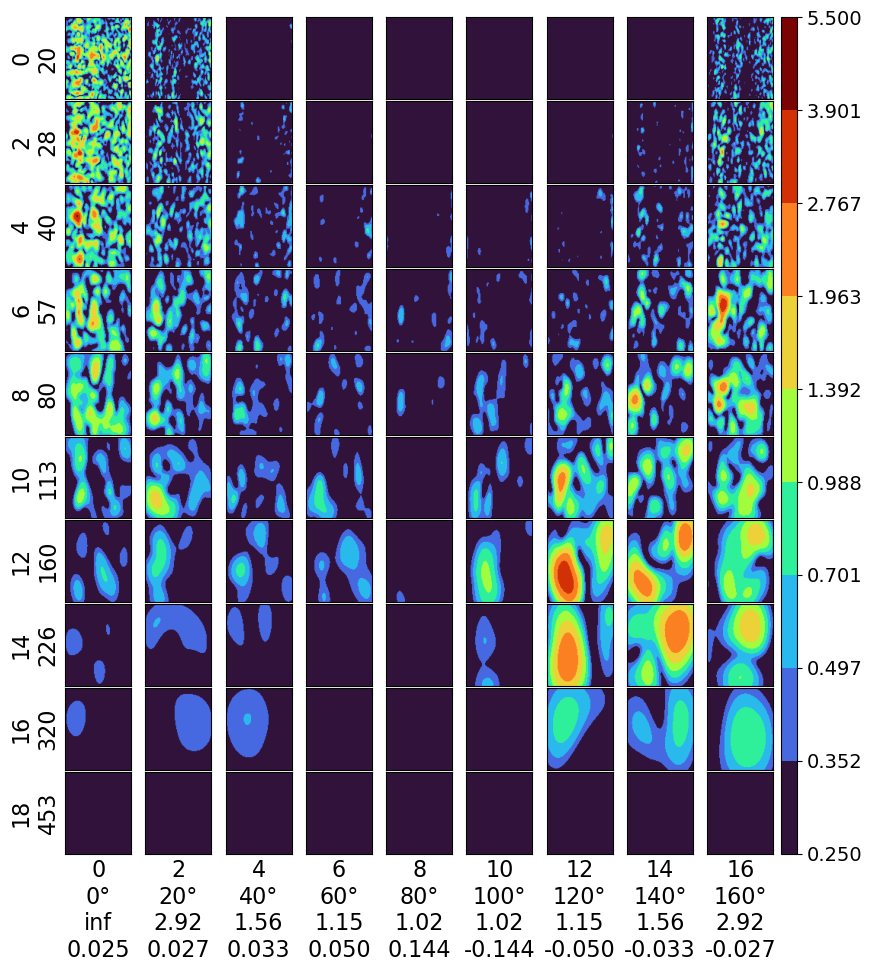

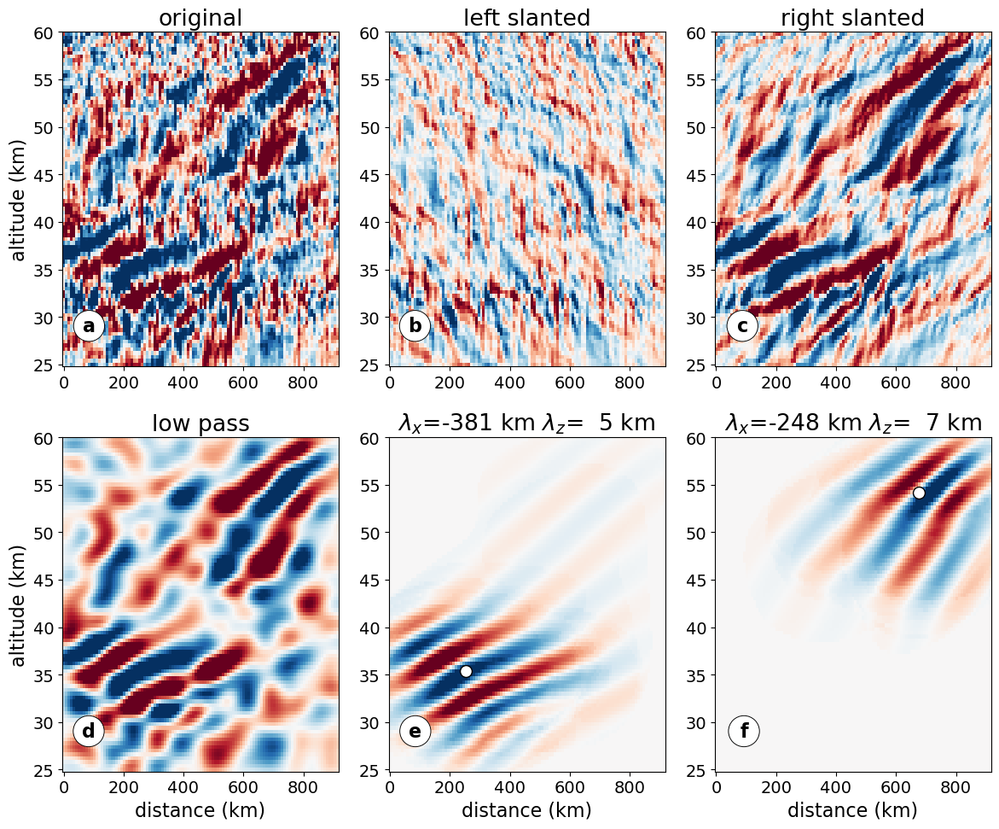

In [48]:
# JUPYTER CELL: example_decompose2d (plots inline)

import os
import glob
import string
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

from juwavelet import transform, utils

# --- Ensure inline plotting when running in Jupyter ---
try:
    get_ipython  # type: ignore[name-defined]
    %matplotlib inline
except Exception:
    pass

# --- Matplotlib display settings ---
matplotlib.rcParams.update({
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14,
    'figure.figsize': [2 * 6.94, 2 * 4.29],
})

def _load_alima(path: str | None = None, pattern: str = "*.txt") -> np.ndarray:
    """
    Simple loader for a text file with the 'alima.txt' layout.

    If `path` is given, load that file.
    Otherwise, find the most recently modified file matching `pattern`
    in the current working directory and load it.

    Returns
    -------
    ndarray
        Raw array from np.loadtxt(...)
    """
    if path is not None:
        if not os.path.isfile(path):
            raise FileNotFoundError(f"File not found: {path}")
        return np.loadtxt(path)

    candidates = [p for p in glob.glob(pattern) if os.path.isfile(p)]
    if not candidates:
        raise FileNotFoundError(
            f"No files found matching pattern '{pattern}' in {os.getcwd()}"
        )
    # Pick the newest .txt
    candidates.sort(key=lambda p: os.path.getmtime(p), reverse=True)
    return np.loadtxt(candidates[0])

def example_decompose2d(path: str | None = None):
    # Load example data (pass a filename or let it auto-pick newest *.txt)
    storage = _load_alima("alima.txt")

    # alima-style layout:
    # row0: [dummy, x1, x2, ...]
    # col0: [dummy; y1; y2; ...]
    # interior: 2D data on (y, x)
    xs, ys, wave = storage[0, 1:], storage[1:, 0], storage[1:, 1:].T
    xs -= xs[0]

    dx = np.diff(xs).mean()
    dy = np.diff(ys).mean()

    # 2D Continuous Wavelet Transform
    cwt = transform.decompose2d(
        wave, dx=dx, dy=dy, s0=20, dj=0.25, js=20, jt=18, aspect=40
    )

    # Identify wave clusters
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=2.0, thr=1.0)

    decomposition, period, theta = [
        cwt[_x] for _x in ("decomposition", "period", "theta")
    ]
    orig = decomposition.copy()

    # Main decomposition overview plot
    cmap = matplotlib.cm.turbo
    norm = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.25), np.log(5.5), 10)), cmap.N
    )
    fig1, _ = utils.plot_decomposition2d(
        cwt, redux_s=2, redux_t=2, cmap=cmap, norm=norm
    )

    # 2x3 grid transposed -> shape (3, 2) so we can index [0..2, 0..1]
    fig2, axs = plt.subplots(2, 3, figsize=(12, 10))
    axs = axs.T  # (3, 2): rows = [0,1,2], cols = [0,1]
    opts = {"cmap": "RdBu_r", "vmin": -5, "vmax": 5, "rasterized": True}

    # (row 0, col 0): original
    axs[0, 0].set_title("original")
    axs[0, 0].pcolormesh(xs, ys, wave.T, **opts)

    # (row 1, col 0): left slanted (theta > pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (np.pi / 2 < theta)] = 0
    rec = transform.reconstruct2d(cwt)
    axs[1, 0].set_title("left slanted")
    axs[1, 0].pcolormesh(xs, ys, rec.T, **opts)

    # (row 2, col 0): right slanted (theta <= pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (theta <= np.pi / 2)] = 0
    rec = transform.reconstruct2d(cwt)
    axs[2, 0].set_title("right slanted")
    axs[2, 0].pcolormesh(xs, ys, rec.T, **opts)

    # (row 0, col 1): low-pass (period >= 100 kept)
    decomposition[:] = orig
    decomposition[period < 100] = 0
    rec = transform.reconstruct2d(cwt)
    axs[0, 1].set_title("low pass")
    axs[0, 1].pcolormesh(xs, ys, rec.T, **opts)

    # (row 1, col 1) and (row 2, col 1): highlight two identified waves (safe-guarded)
    demo_indices = [1, 7]
    targets = [(1, axs[1, 1]), (2, axs[2, 1])]
    for (demo_idx, (rowi, ax)) in zip(demo_indices, targets):
        if isinstance(idxs, (list, tuple)) and demo_idx < len(idxs):
            decomposition[:] = orig
            decomposition[iwave != demo_idx] = 0
            udx = idxs[demo_idx]
            rec = transform.reconstruct2d(cwt)
            ax.set_title(
                rf"$\lambda_x$={cwt['wavelength_x'][udx[0], udx[1]]:3.0f} km "
                rf"$\lambda_z$={cwt['wavelength_y'][udx[0], udx[1]]:3.0f} km"
            )
            ax.pcolormesh(xs, ys, rec.T, **opts)

            # mark peak location for that wave component
            decomposition[:] = np.abs(decomposition)
            max_idx = np.unravel_index(
                decomposition[udx[0], udx[1]].argmax(), decomposition[0, 0].shape
            )
            ax.plot(xs[max_idx[0]], ys[max_idx[1]], "o", color="w", mec="k", ms=10)

            # brief console info
            print(f"Wave {demo_idx}: peak amp = {decomposition[udx[0], udx[1]].max():.3f}")
        else:
            ax.set_title(f"wave {demo_idx} not found")
            ax.axis("off")

    # Axis labels
    for ax in axs[:, 1]:
        ax.set_xlabel("distance (km)")
    for ax in axs[0, :]:
        ax.set_ylabel("altitude (km)")

    # Little letter labels (a, b, c, ...)
    letterbox = {"boxstyle": "circle", "lw": 0.67, "facecolor": "white", "edgecolor": "black"}
    for ax, letter in zip(axs.T.reshape(-1), string.ascii_lowercase):
        ax.text(
            0.12, 0.15, letter, transform=ax.transAxes,
            bbox=letterbox, va="top", ha="right", weight="bold"
        )

    fig2.tight_layout()

    # --- Show inline in notebook ---
    plt.show(fig1)
    plt.show(fig2)

# Run in notebook (optionally pass a filename like "my_data_2025_11_03.txt")
example_decompose2d()


## Using a Synthetic 2D Field

Saved: .\alima_synth.txt
Saved: .\alima_synth.npy


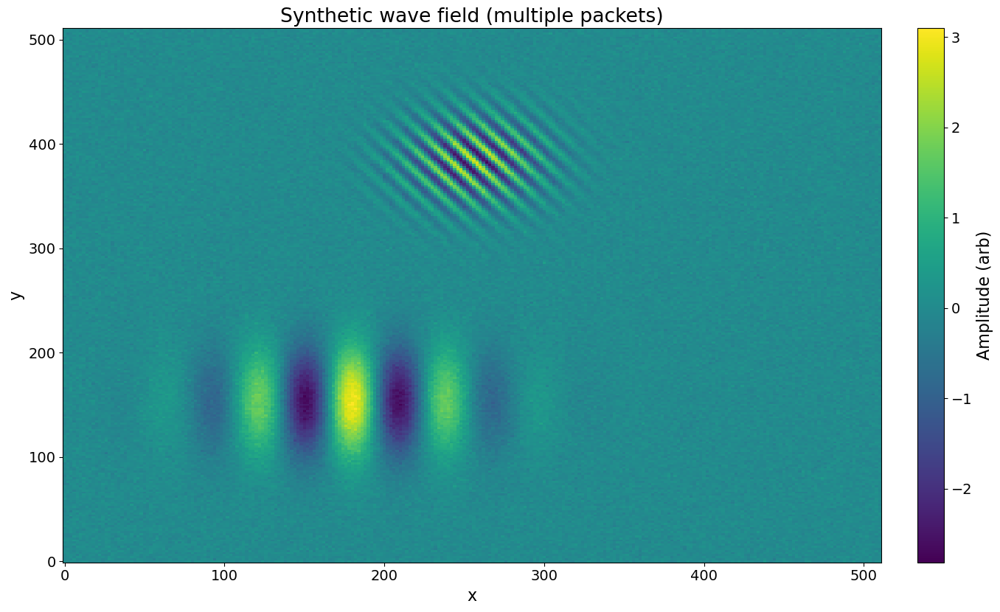

In [90]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
example_decompose2d_synthetic.py

This version generates a synthetic 2D field composed of several wave
packets (different orientations, wavelengths, and envelope sizes), then
saves it in the exact same matrix format as alima.txt:

  row0 = [0, x1, x2, ...]
  col0 = [0; y1; y2; ...]
  interior = field on (y, x)
"""

from __future__ import annotations

import os
import math
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Sequence, Tuple

# Optional: keep this if your original environment has juwavelet
try:
    from juwavelet import transform  # noqa: F401
    _HAS_JUWAVELET = True
except Exception:
    _HAS_JUWAVELET = False

matplotlib.rcParams.update({
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14,
    'figure.figsize': [2 * 6.94, 2 * 4.29],
})


@dataclass
class WavePacket:
    """Parameters for a 2D plane-wave packet with a Gaussian envelope.

    Field:
      A * exp(-((x-x0)^2/(2*sx^2) + (y-y0)^2/(2*sy^2))) * cos(kx*x + ky*y + phi)

    You may specify (kx, ky) directly or (k, theta) in radians.
    """
    amplitude: float = 1.0
    kx: float | None = None
    ky: float | None = None
    k: float | None = None
    theta: float | None = None  # radians, measured from +x toward +y
    x0: float = 0.0
    y0: float = 0.0
    sx: float = 10.0
    sy: float = 10.0
    phi: float = 0.0

    def k_components(self) -> Tuple[float, float]:
        if self.kx is not None and self.ky is not None:
            return self.kx, self.ky
        if self.k is None or self.theta is None:
            raise ValueError("Provide either (kx, ky) or (k, theta) for WavePacket.")
        return self.k * math.cos(self.theta), self.k * math.sin(self.theta)


def make_grid(nx: int, ny: int, dx: float, dy: float) -> Tuple[np.ndarray, np.ndarray]:
    """Create 2D coordinate arrays (x, y) for an nx-by-ny grid."""
    x = np.arange(nx, dtype=float) * dx
    y = np.arange(ny, dtype=float) * dy
    X, Y = np.meshgrid(x, y)
    return X, Y


def packet_field(xs: np.ndarray, ys: np.ndarray, pkt: WavePacket) -> np.ndarray:
    kx, ky = pkt.k_components()
    gauss = np.exp(-(((xs - pkt.x0) ** 2) / (2 * pkt.sx ** 2) + ((ys - pkt.y0) ** 2) / (2 * pkt.sy ** 2)))
    phase = kx * xs + ky * ys + pkt.phi
    return pkt.amplitude * gauss * np.cos(phase)


def generate_synthetic_field(
    nx: int = 256,
    ny: int = 256,
    dx: float = 1.0,
    dy: float = 1.0,
    packets: Sequence[WavePacket] | None = None,
    noise_sigma: float = 0.1,
    seed: int | None = 0,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Build a synthetic 2D field from multiple plane-wave packets.

    Returns
    -------
    xs, ys, field : 2D arrays of shape (ny, nx)
    """
    if seed is not None:
        rng = np.random.default_rng(seed)
    else:
        rng = np.random.default_rng()

    xs, ys = make_grid(nx, ny, dx, dy)

    if packets is None:
        # Diverse packets with different orientations and wavelengths
        Lx = nx * dx
        Ly = ny * dy
        packets = [
            WavePacket(amplitude=3.0, k=2 * math.pi / 60.0, theta=math.radians(0),
                       x0=0.35 * Lx, y0=0.30 * Ly, sx=56, sy=36, phi=0.0),
            #WavePacket(amplitude=1.9, k=2 * math.pi / 20.0, theta=math.radians(80),
            #           x0=0.65 * Lx, y0=0.50 * Ly, sx=22, sy=30, phi=0.7),
            WavePacket(amplitude=2.7, k=2 * math.pi / 12.0, theta=math.radians(35),
                       x0=0.50 * Lx, y0=0.75 * Ly, sx=32, sy=32, phi=1.1),
            #WavePacket(amplitude=4.6, kx=2 * math.pi / 8.0, ky=0.0,
            #           x0=0.80 * Lx, y0=0.20 * Ly, sx=10, sy=10, phi=0.3),
        ]

    field = np.zeros_like(xs)
    for pkt in packets:
        field += packet_field(xs, ys, pkt)

    if noise_sigma > 0:
        field = field + rng.normal(0.0, noise_sigma, size=field.shape)

    return xs, ys, field


def quicklook(xs: np.ndarray, ys: np.ndarray, field: np.ndarray, title: str = "Synthetic wave field") -> None:
    fig, ax = plt.subplots()
    im = ax.pcolormesh(xs, ys, field, shading='auto')
    cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cb.set_label("Amplitude (arb)")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_title(title)
    plt.tight_layout()


def save_compat_outputs(xs: np.ndarray, ys: np.ndarray, field: np.ndarray,
                        out_dir: str = ".", base: str = "alima_synth") -> Tuple[str, str]:
    """
    Save exactly like alima.txt:
      row0 = [0, x1, x2, ...]
      col0 = [0; y1; y2; ...]
      interior = field on (y, x)
    Also save a .npy for fast reload.
    """
    os.makedirs(out_dir, exist_ok=True)
    txt_path = os.path.join(out_dir, f"{base}.txt")
    npy_path = os.path.join(out_dir, f"{base}.npy")

    # Extract 1D coordinates from meshgrid
    x1d = xs[0, :]   # length nx
    y1d = ys[:, 0]   # length ny

    # Build (ny+1, nx+1) table
    table = np.zeros((ys.shape[0] + 1, xs.shape[1] + 1), dtype=float)
    table[0, 1:] = x1d
    table[1:, 0] = y1d
    table[1:, 1:] = field  # interior is (y, x)

    np.savetxt(txt_path, table)
    np.save(npy_path, field)
    return txt_path, npy_path


def main():
    # 1) Generate synthetic field
    xs, ys, field = generate_synthetic_field(
        nx=256,
        ny=256,
        dx=2.0,
        dy=2.0,
        packets=None,
        noise_sigma=0.10,
        seed=0,
    )

    # 2) Save results in alima-compatible matrix format (and a .npy)
    txt_path, npy_path = save_compat_outputs(xs, ys, field, out_dir='.', base='alima_synth')
    print(f"Saved: {txt_path}\nSaved: {npy_path}")

    # 3) Quicklook
    quicklook(xs, ys, field, title="Synthetic wave field (multiple packets)")

if __name__ == "__main__":
    main()


------------
cluster= 0
amplitude= 2.377087971913188 idx= (np.int64(1), np.int64(7), np.int64(128), np.int64(192))
selected elements: 100167
------------
cluster= 1
amplitude= 1.0977560130261468 idx= (np.int64(10), np.int64(0), np.int64(90), np.int64(77))
selected elements: 414611
------------
cluster= 2
amplitude= 1.0556155437898955 idx= (np.int64(10), np.int64(35), np.int64(90), np.int64(77))
selected elements: 332868


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 29.47it/s]


Wave 0: peak amp = 1.198-1.989j
Wave 1: peak amp = 0.004+0.021j


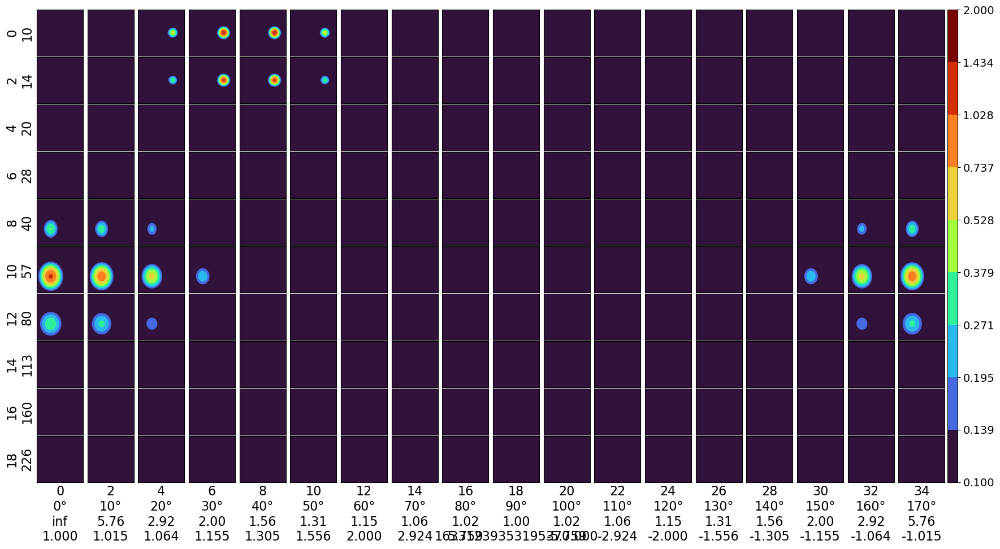

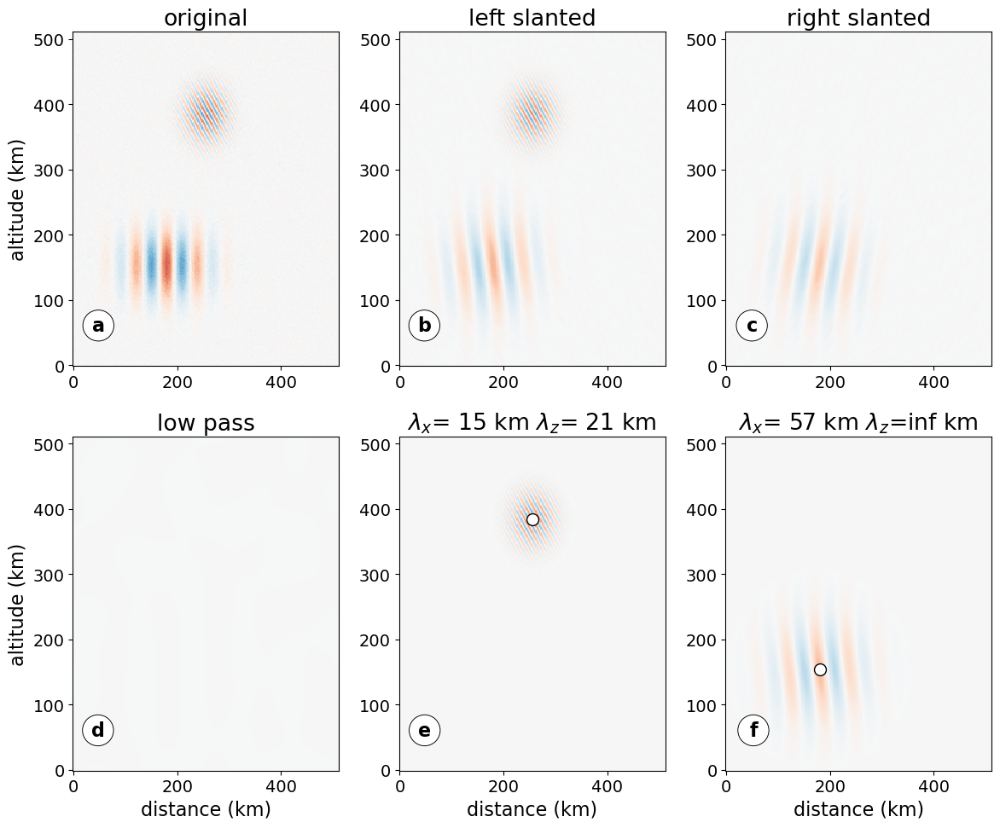

In [198]:
# JUPYTER CELL: example_decompose2d (plots inline)

import os
import glob
import string
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

from juwavelet import transform, utils

# --- Ensure inline plotting when running in Jupyter ---
try:
    get_ipython  # type: ignore[name-defined]
    %matplotlib inline
except Exception:
    pass

# --- Matplotlib display settings ---
matplotlib.rcParams.update({
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14,
    'figure.figsize': [2 * 6.94, 2 * 4.29],
})

def _load_alima(path: str | None = None, pattern: str = "*.txt") -> np.ndarray:
    """
    Simple loader for a text file with the 'alima.txt' layout.

    If `path` is given, load that file.
    Otherwise, find the most recently modified file matching `pattern`
    in the current working directory and load it.

    Returns
    -------
    ndarray
        Raw array from np.loadtxt(...)
    """
    if path is not None:
        if not os.path.isfile(path):
            raise FileNotFoundError(f"File not found: {path}")
        return np.loadtxt(path)

    candidates = [p for p in glob.glob(pattern) if os.path.isfile(p)]
    if not candidates:
        raise FileNotFoundError(
            f"No files found matching pattern '{pattern}' in {os.getcwd()}"
        )
    # Pick the newest .txt
    candidates.sort(key=lambda p: os.path.getmtime(p), reverse=True)
    return np.loadtxt(candidates[0])

def example_decompose2d(path: str | None = None):
    # Load example data (pass a filename or let it auto-pick newest *.txt)
    storage = _load_alima("alima_synth.txt")

    # alima-style layout:
    # row0: [dummy, x1, x2, ...]
    # col0: [dummy; y1; y2; ...]
    # interior: 2D data on (y, x)
    xs, ys, wave = storage[0, 1:], storage[1:, 0], storage[1:, 1:].T
    xs -= xs[0]

    dx = np.diff(xs).mean()
    dy = np.diff(ys).mean()

    # 2D Continuous Wavelet Transform
    cwt = transform.decompose2d(
        wave, dx=dx, dy=dy, s0=10, dj=0.25, js=20, jt=36, aspect=1
    )

    # Identify wave clusters
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=1.0, thr=0.1)
    #amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=2.0, thr=1.0)

    decomposition, period, theta = [
        cwt[_x] for _x in ("decomposition", "period", "theta")
    ]
    orig = decomposition.copy()

    # Main decomposition overview plot
    cmap = matplotlib.cm.turbo
    norm = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.1), np.log(2), 10)), cmap.N
    )
    fig1, _ = utils.plot_decomposition2d(
        cwt, redux_s=2, redux_t=2, cmap=cmap, norm=norm
    )

    # 2x3 grid transposed -> shape (3, 2) so we can index [0..2, 0..1]
    fig2, axs = plt.subplots(2, 3, figsize=(12, 10))
    axs = axs.T  # (3, 2): rows = [0,1,2], cols = [0,1]
    opts = {"cmap": "RdBu_r", "vmin": -5, "vmax": 5, "rasterized": True}

    # (row 0, col 0): original
    axs[0, 0].set_title("original")
    axs[0, 0].pcolormesh(xs, ys, wave.T, **opts)

    # (row 1, col 0): left slanted (theta > pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (np.pi / 2 < theta)] = 0
    rec = transform.reconstruct2d(cwt)
    axs[1, 0].set_title("left slanted")
    axs[1, 0].pcolormesh(xs, ys, rec.T, **opts)

    # (row 2, col 0): right slanted (theta <= pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (theta <= np.pi / 2)] = 0
    rec = transform.reconstruct2d(cwt)
    axs[2, 0].set_title("right slanted")
    axs[2, 0].pcolormesh(xs, ys, rec.T, **opts)

    # (row 0, col 1): low-pass (period >= 100 kept)
    decomposition[:] = orig
    decomposition[period < 100] = 0
    rec = transform.reconstruct2d(cwt)
    axs[0, 1].set_title("low pass")
    axs[0, 1].pcolormesh(xs, ys, rec.T, **opts)

    # (row 1, col 1) and (row 2, col 1): highlight two identified waves (safe-guarded)
    demo_indices = [0,1]
    targets = [(1, axs[1, 1]), (2, axs[2, 1])]
    for (demo_idx, (rowi, ax)) in zip(demo_indices, targets):
        if isinstance(idxs, (list, tuple)) and demo_idx < len(idxs):
            decomposition[:] = orig
            decomposition[iwave != demo_idx] = 0
            udx = idxs[demo_idx]
            rec = transform.reconstruct2d(cwt)
            ax.set_title(
                rf"$\lambda_x$={cwt['wavelength_x'][udx[0], udx[1]]:3.0f} km "
                rf"$\lambda_z$={cwt['wavelength_y'][udx[0], udx[1]]:3.0f} km"
            )
            ax.pcolormesh(xs, ys, rec.T, **opts)

            # mark peak location for that wave component
            decomposition[:] = np.abs(decomposition)
            max_idx = np.unravel_index(
                decomposition[udx[0], udx[1]].argmax(), decomposition[0, 0].shape
            )
            ax.plot(xs[max_idx[0]], ys[max_idx[1]], "o", color="w", mec="k", ms=10)
            # <-- add this restore so the next panel starts from the full CWT
            decomposition[:] = orig

            # brief console info
            print(f"Wave {demo_idx}: peak amp = {decomposition[udx[0], udx[1]].max():.3f}")
        else:
            ax.set_title(f"wave {demo_idx} not found")
            ax.axis("off")

    # Axis labels
    for ax in axs[:, 1]:
        ax.set_xlabel("distance (km)")
    for ax in axs[0, :]:
        ax.set_ylabel("altitude (km)")

    # Little letter labels (a, b, c, ...)
    letterbox = {"boxstyle": "circle", "lw": 0.67, "facecolor": "white", "edgecolor": "black"}
    for ax, letter in zip(axs.T.reshape(-1), string.ascii_lowercase):
        ax.text(
            0.12, 0.15, letter, transform=ax.transAxes,
            bbox=letterbox, va="top", ha="right", weight="bold"
        )

    fig2.tight_layout()

    # --- Show inline in notebook ---
    plt.show(fig1)
    plt.show(fig2)

# Run in notebook (optionally pass a filename like "my_data_2025_11_03.txt")
example_decompose2d()


## Using Synthetic 2D Field + JUWAVELET decompose2d

------------
cluster= 0
amplitude= 2.377087971913188 idx= (np.int64(1), np.int64(7), np.int64(128), np.int64(192))
selected elements: 100167
------------
cluster= 1
amplitude= 1.0977560130261468 idx= (np.int64(10), np.int64(0), np.int64(90), np.int64(77))
selected elements: 414611
------------
cluster= 2
amplitude= 1.0556155437898955 idx= (np.int64(10), np.int64(35), np.int64(90), np.int64(77))
selected elements: 332868


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 18.51it/s]


Wave 0: peak amp = 2.377+0.000j
Wave 1: peak amp = 1.098+0.000j


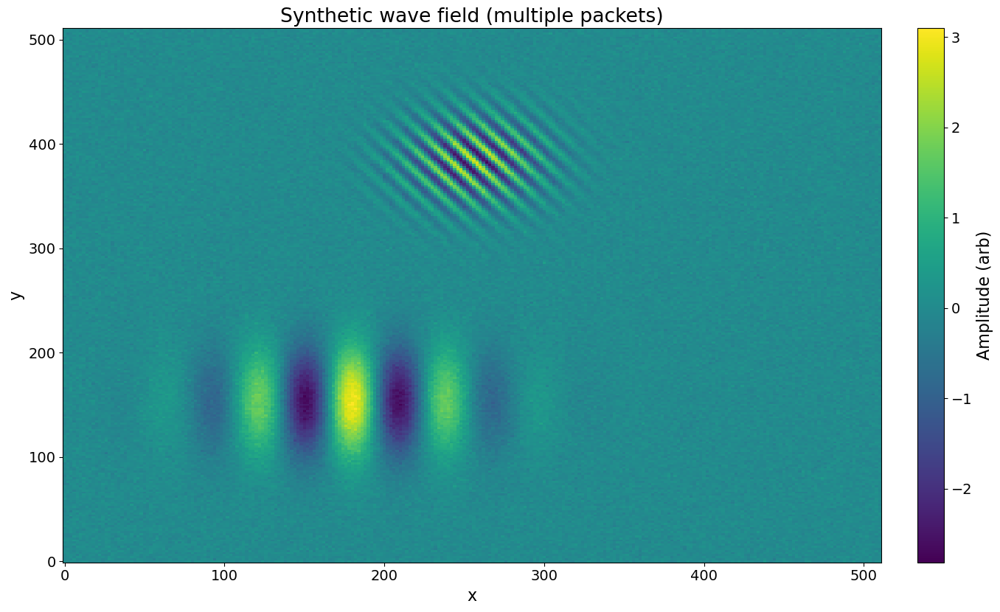

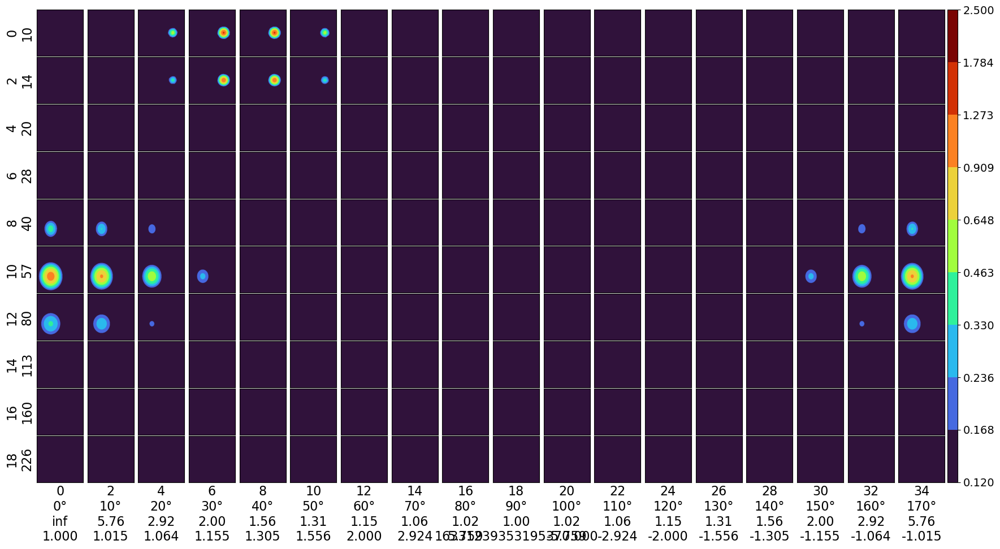

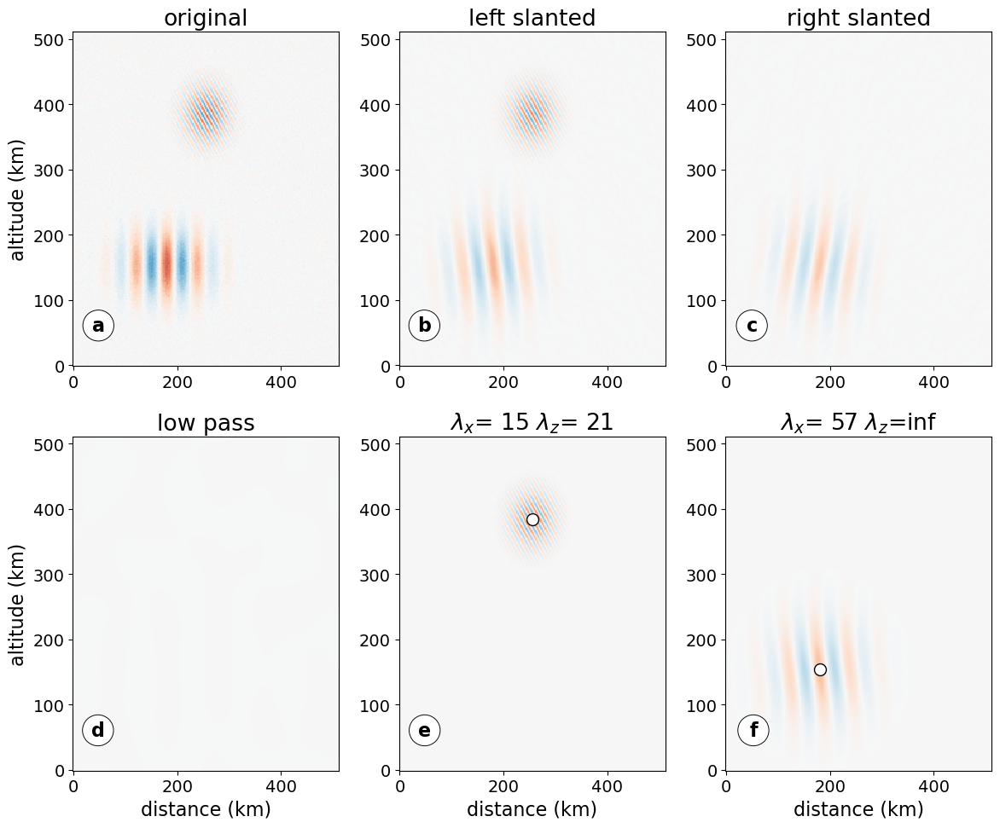

In [143]:
# JUPYTER CELL: synthetic 2D field + juwavelet decompose2d (native, fixed axes)

from __future__ import annotations
import math
import string
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Sequence, Tuple

# Inline plotting if you're in Jupyter
try:
    get_ipython  # type: ignore[name-defined]
    %matplotlib inline
except Exception:
    pass

from juwavelet import transform, utils

# --- Matplotlib display settings ---
matplotlib.rcParams.update({
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14,
    'figure.figsize': [2 * 6.94, 2 * 4.29],
})

# --------------------------
# Synthetic field generator
# --------------------------
@dataclass
class WavePacket:
    """2D plane-wave packet with Gaussian envelope.
       A * exp(-((x-x0)^2/(2*sx^2) + (y-y0)^2/(2*sy^2))) * cos(kx*x + ky*y + phi)
       Provide (kx, ky) or (k, theta) in radians.
    """
    amplitude: float = 1.0
    kx: float | None = None
    ky: float | None = None
    k: float | None = None
    theta: float | None = None
    x0: float = 0.0
    y0: float = 0.0
    sx: float = 10.0
    sy: float = 10.0
    phi: float = 0.0

    def k_components(self) -> Tuple[float, float]:
        if self.kx is not None and self.ky is not None:
            return self.kx, self.ky
        if self.k is None or self.theta is None:
            raise ValueError("Provide either (kx, ky) or (k, theta) for WavePacket.")
        return self.k * math.cos(self.theta), self.k * math.sin(self.theta)

def make_grid(nx: int, ny: int, dx: float, dy: float) -> Tuple[np.ndarray, np.ndarray]:
    x = np.arange(nx, dtype=float) * dx
    y = np.arange(ny, dtype=float) * dy
    X, Y = np.meshgrid(x, y)  # shapes (ny, nx)
    return X, Y

def packet_field(xs: np.ndarray, ys: np.ndarray, pkt: WavePacket) -> np.ndarray:
    kx, ky = pkt.k_components()
    gauss = np.exp(-(((xs - pkt.x0) ** 2) / (2 * pkt.sx ** 2) + ((ys - pkt.y0) ** 2) / (2 * pkt.sy ** 2)))
    phase = kx * xs + ky * ys + pkt.phi
    return pkt.amplitude * gauss * np.cos(phase)

def generate_synthetic_field(
    nx: int = 256,
    ny: int = 256,
    dx: float = 2.0,
    dy: float = 2.0,
    packets: Sequence[WavePacket] | None = None,
    noise_sigma: float = 0.10,
    seed: int | None = 0,
) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    rng = np.random.default_rng(seed) if seed is not None else np.random.default_rng()
    xs, ys = make_grid(nx, ny, dx, dy)

    if packets is None:
        Lx = nx * dx
        Ly = ny * dy
        packets = [
            WavePacket(amplitude=3.0, k=2 * math.pi / 60.0, theta=math.radians(0),
                       x0=0.35 * Lx, y0=0.30 * Ly, sx=56, sy=36, phi=0.0),
            WavePacket(amplitude=2.7, k=2 * math.pi / 12.0, theta=math.radians(35),
                       x0=0.50 * Lx, y0=0.75 * Ly, sx=32, sy=32, phi=1.1),
        ]

    field = np.zeros_like(xs)
    for pkt in packets:
        field += packet_field(xs, ys, pkt)

    if noise_sigma > 0:
        field = field + rng.normal(0.0, noise_sigma, size=field.shape)

    return xs, ys, field  # shapes: (ny, nx), (ny, nx), (ny, nx)

def quicklook(xs2d: np.ndarray, ys2d: np.ndarray, field: np.ndarray, title: str = "Synthetic wave field") -> None:
    x1d = xs2d[0, :]
    y1d = ys2d[:, 0]
    fig, ax = plt.subplots()
    im = ax.pcolormesh(x1d, y1d, field, shading='auto')
    cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cb.set_label("Amplitude (arb)")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_title(title)
    plt.tight_layout()

# --------------------------
# Combined pipeline in RAM
# --------------------------
# 1) Make synthetic data in memory
xs2d, ys2d, wave = generate_synthetic_field(nx=256, ny=256, dx=2.0, dy=2.0, seed=0)

# Optional quicklook of the raw field
quicklook(xs2d, ys2d, wave, title="Synthetic wave field (multiple packets)")

# 2) Coordinates and spacings
x1d = xs2d[0, :].copy()
y1d = ys2d[:, 0].copy()
x1d -= x1d[0]          # start x at 0 for convenience
dx = np.diff(x1d).mean()
dy = np.diff(y1d).mean()

# 3) >>> KEY: decompose on (nx, ny), so transpose first
wave_xy = wave.T  # shape (nx, ny)

cwt = transform.decompose2d(
    wave_xy, dx=dx, dy=dy, s0=10, dj=0.25, js=20, jt=36, aspect=1
)

# Identify wave clusters
amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=1.0, thr=0.1)

decomposition, period, theta = [cwt[k] for k in ("decomposition", "period", "theta")]
orig = decomposition.copy()

# 4) Overview plot from juwavelet
cmap = matplotlib.cm.turbo
norm = matplotlib.colors.BoundaryNorm(
    np.exp(np.linspace(np.log(0.12), np.log(2.5), 10)), cmap.N
)
fig1, _ = utils.plot_decomposition2d(cwt, redux_s=2, redux_t=2, cmap=cmap, norm=norm)

# 5) Component plots
fig2, axs = plt.subplots(2, 3, figsize=(12, 10))
axs = axs.T  # shape (3, 2)
opts = {"cmap": "RdBu_r", "vmin": -5, "vmax": 5, "rasterized": True}

# original
axs[0, 0].set_title("original")
axs[0, 0].pcolormesh(x1d, y1d, wave, **opts)

# left slanted (theta > pi/2 masked out)
decomposition[:] = orig
decomposition[:, (np.pi / 2 < theta)] = 0
rec = transform.reconstruct2d(cwt)  # shape (nx, ny)
axs[1, 0].set_title("left slanted")
axs[1, 0].pcolormesh(x1d, y1d, rec.T, **opts)  # transpose back for plotting

# right slanted (theta <= pi/2 masked out)
decomposition[:] = orig
decomposition[:, (theta <= np.pi / 2)] = 0
rec = transform.reconstruct2d(cwt)
axs[2, 0].set_title("right slanted")
axs[2, 0].pcolormesh(x1d, y1d, rec.T, **opts)

# low-pass (period >= 100 kept)
decomposition[:] = orig
decomposition[period < 100] = 0
rec = transform.reconstruct2d(cwt)
axs[0, 1].set_title("low pass")
axs[0, 1].pcolormesh(x1d, y1d, rec.T, **opts)

# highlight two identified waves
demo_indices = [0, 1]
targets = [(1, axs[1, 1]), (2, axs[2, 1])]
for (demo_idx, (rowi, ax)) in zip(demo_indices, targets):
    if isinstance(idxs, (list, tuple)) and demo_idx < len(idxs):
        decomposition[:] = orig
        decomposition[iwave != demo_idx] = 0
        udx = idxs[demo_idx]
        rec = transform.reconstruct2d(cwt)
        ax.set_title(
            rf"$\lambda_x$={cwt['wavelength_x'][udx[0], udx[1]]:3.0f} "
            rf"$\lambda_z$={cwt['wavelength_y'][udx[0], udx[1]]:3.0f}"
        )
        ax.pcolormesh(x1d, y1d, rec.T, **opts)

        # mark peak location
        decomposition[:] = np.abs(decomposition)
        max_idx = np.unravel_index(
            decomposition[udx[0], udx[1]].argmax(), decomposition[0, 0].shape
        )
        ax.plot(x1d[max_idx[0]], y1d[max_idx[1]], "o", color="w", mec="k", ms=10)
        print(f"Wave {demo_idx}: peak amp = {decomposition[udx[0], udx[1]].max():.3f}")
    else:
        ax.set_title(f"wave {demo_idx} not found")
        ax.axis("off")

# labels
for ax in axs[:, 1]:
    ax.set_xlabel("distance (km)")
for ax in axs[0, :]:
    ax.set_ylabel("altitude (km)")

# letter tags
letterbox = {"boxstyle": "circle", "lw": 0.67, "facecolor": "white", "edgecolor": "black"}
for ax, letter in zip(axs.T.reshape(-1), string.ascii_lowercase):
    ax.text(0.12, 0.15, letter, transform=ax.transAxes,
            bbox=letterbox, va="top", ha="right", weight="bold")

fig2.tight_layout()

plt.show(fig1)
plt.show(fig2)


## Adding More Waves

------------
cluster= 0
amplitude= 1.838939774299177 idx= (np.int64(3), np.int64(6), np.int64(153), np.int64(141))
selected elements: 62628
------------
cluster= 1
amplitude= 1.2131845236025351 idx= (np.int64(8), np.int64(0), np.int64(64), np.int64(179))
selected elements: 99707
------------
cluster= 2
amplitude= 1.1649545128943022 idx= (np.int64(8), np.int64(35), np.int64(64), np.int64(179))
selected elements: 75310


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 19.51it/s]


Wave 0: peak amp = 1.839+0.000j
Wave 1: peak amp = 1.213+0.000j


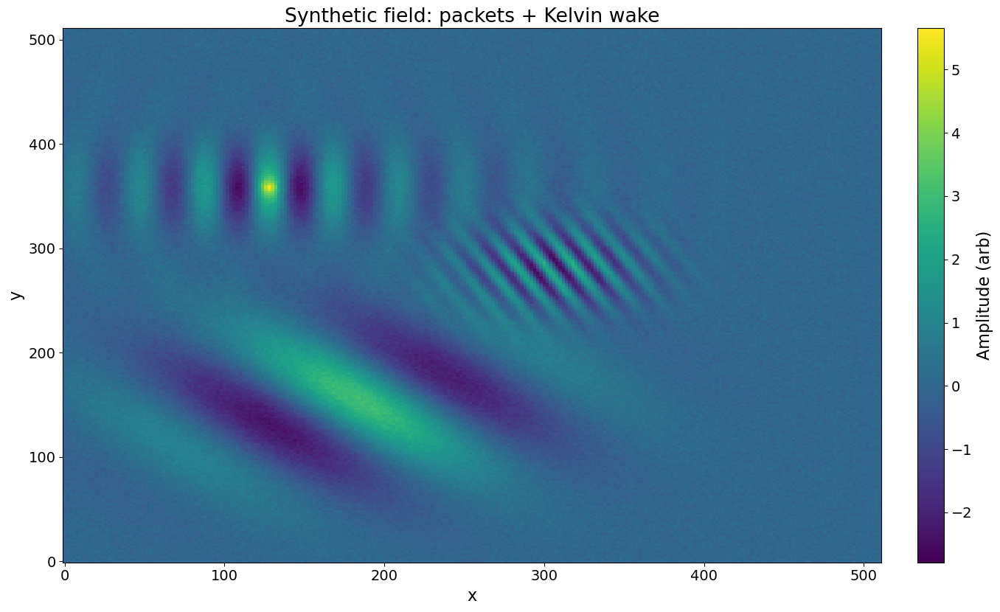

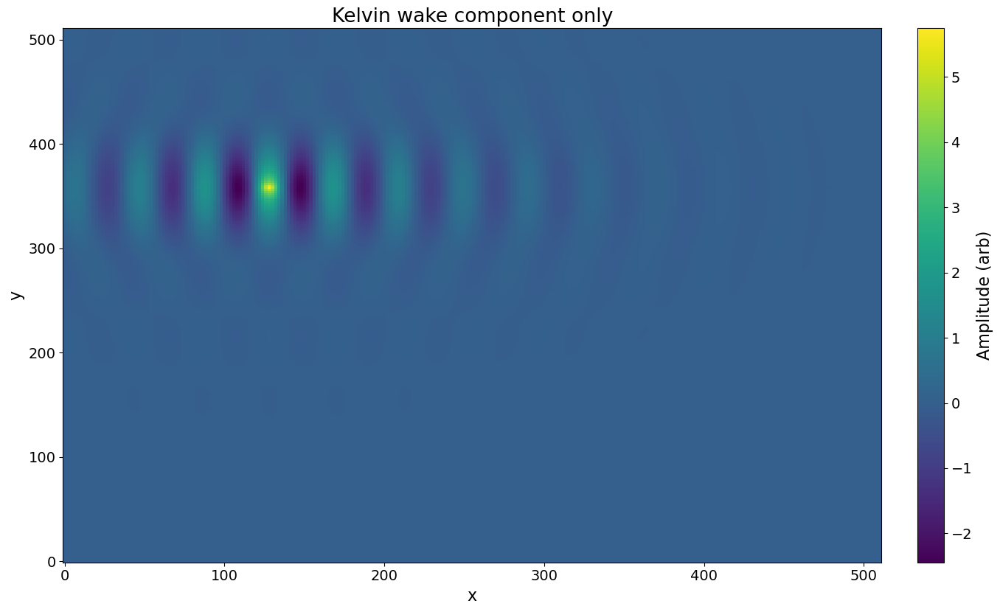

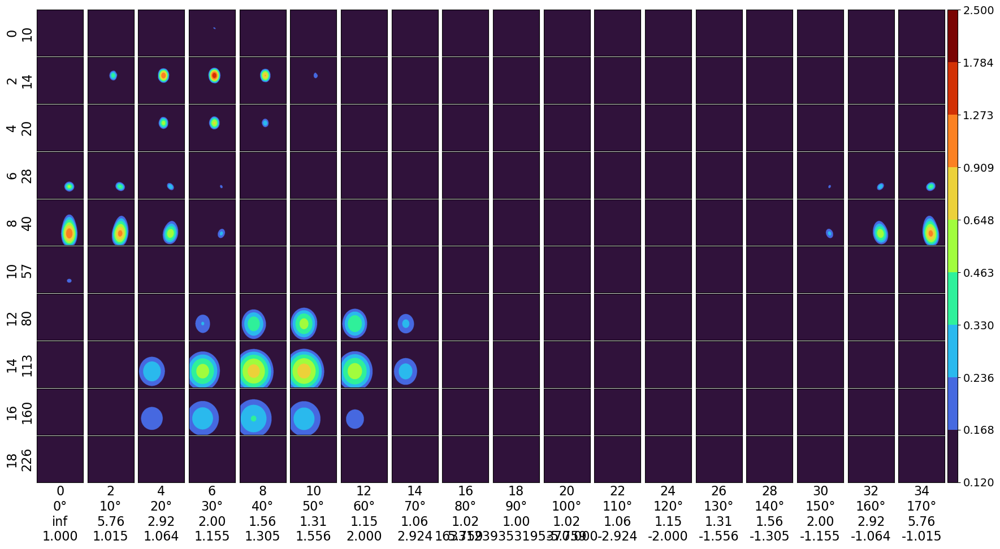

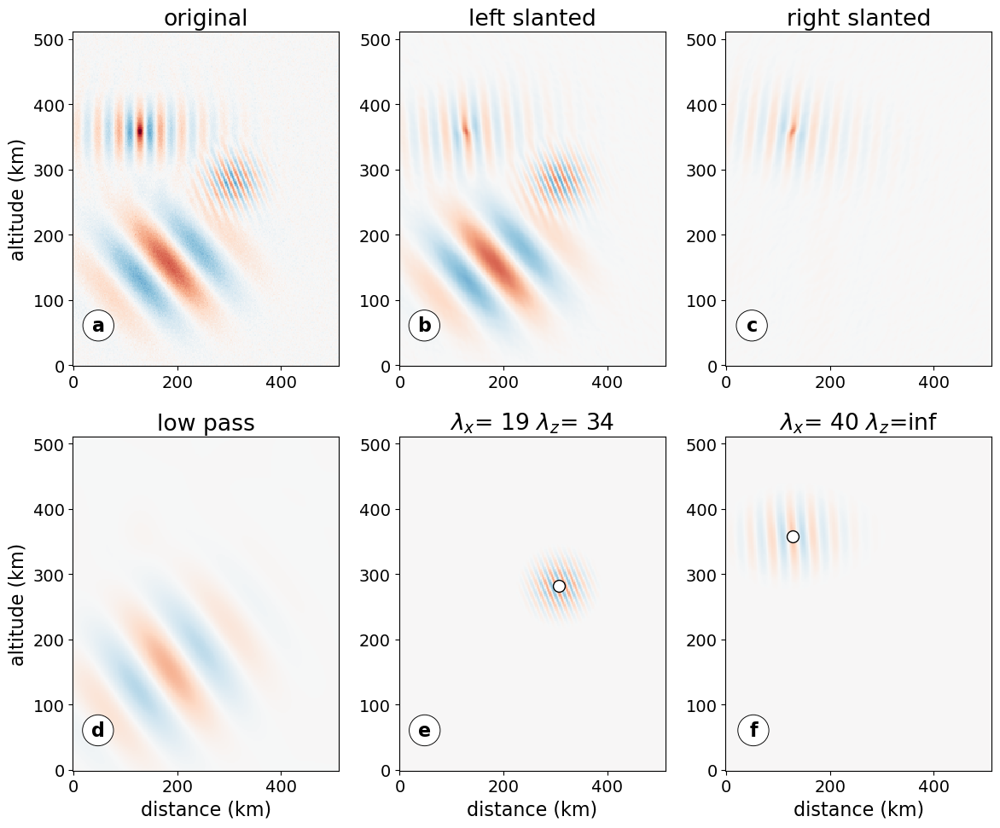

In [145]:
# example_decompose2d_synthetic_kelvin.py
# Generate a synthetic 2D field with several wave packets + a Kelvin wake,
# then run juwavelet's 2D CWT and plot components. No files written.

from __future__ import annotations
import math
import string
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Sequence, Tuple

# Inline plotting if you're in Jupyter
try:
    get_ipython  # type: ignore[name-defined]
    %matplotlib inline
except Exception:
    pass

from juwavelet import transform, utils

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14,
    'figure.figsize': [2 * 6.94, 2 * 4.29],
})

# --------------------------
# Wave packets
# --------------------------
@dataclass
class WavePacket:
    """2D plane-wave packet with Gaussian envelope.
       A * exp(-((x-x0)^2/(2*sx^2) + (y-y0)^2/(2*sy^2))) * cos(kx*x + ky*y + phi)
       Provide (kx, ky) or (k, theta) in radians.
    """
    amplitude: float = 1.0
    kx: float | None = None
    ky: float | None = None
    k: float | None = None
    theta: float | None = None
    x0: float = 0.0
    y0: float = 0.0
    sx: float = 10.0
    sy: float = 10.0
    phi: float = 0.0

    def k_components(self) -> Tuple[float, float]:
        if self.kx is not None and self.ky is not None:
            return self.kx, self.ky
        if self.k is None or self.theta is None:
            raise ValueError("Provide either (kx, ky) or (k, theta) for WavePacket.")
        return self.k * math.cos(self.theta), self.k * math.sin(self.theta)

# --------------------------
# Grid + helpers
# --------------------------
def make_grid(nx: int, ny: int, dx: float, dy: float) -> Tuple[np.ndarray, np.ndarray]:
    x = np.arange(nx, dtype=float) * dx
    y = np.arange(ny, dtype=float) * dy
    X, Y = np.meshgrid(x, y)  # shapes (ny, nx)
    return X, Y

def packet_field(xs: np.ndarray, ys: np.ndarray, pkt: WavePacket) -> np.ndarray:
    kx, ky = pkt.k_components()
    gauss = np.exp(-(((xs - pkt.x0) ** 2) / (2 * pkt.sx ** 2) + ((ys - pkt.y0) ** 2) / (2 * pkt.sy ** 2)))
    phase = kx * xs + ky * ys + pkt.phi
    return pkt.amplitude * gauss * np.cos(phase)

# --------------------------
# Kelvin wake (simplified)
# --------------------------
def kelvin_wake_field(
    xs: np.ndarray,
    ys: np.ndarray,
    *,
    x0: float,
    y0: float,
    k0: float = 2 * math.pi / 40.0,  # dominant wavenumber
    amp: float = 2.0,
    nt: int = 181,                   # number of direction samples inside wedge
    theta_wedge_deg: float = 19.47,  # Kelvin wedge half angle ~ arcsin(1/3)
    envelope_sigma: float = 120.0,   # Gaussian decay around source
    radial_damp: float = 0.35,       # 1/sqrt(r) style damping factor
) -> np.ndarray:
    """
    Build a simple Kelvin ship-wake pattern by summing plane waves inside the
    Kelvin wedge [-theta_K, +theta_K]. This is not a full dispersion solution,
    but it produces the classic V-shaped interference.
    Track direction = +x.

    Parameters
    ----------
    k0 : base wavenumber
    amp : overall amplitude
    nt  : number of angular samples in wedge
    theta_wedge_deg : Kelvin wedge half-angle
    envelope_sigma : Gaussian envelope around source to localize the wake
    radial_damp : strength of radial damping 1/sqrt(r)

    Returns
    -------
    ndarray field with shape like xs/ys (ny, nx)
    """
    # Shift coords relative to source
    Xc = xs - x0
    Yc = ys - y0
    r = np.hypot(Xc, Yc)
    # Avoid division by zero at the source
    r_safe = np.maximum(r, 1.0)

    # Angular samples in wedge
    thK = math.radians(theta_wedge_deg)
    thetas = np.linspace(-thK, thK, nt)

    field = np.zeros_like(xs, dtype=float)

    # Angular weighting to emphasize wedge edges a bit
    # and include transverse waves near 0 deg
    theta_weight = 0.6 + 0.4 * (np.cos(thetas / thK * math.pi / 2) ** 2)

    for w, theta in zip(theta_weight, thetas):
        # Directional plane wave along angle theta relative to +x
        phase = k0 * (Xc * math.cos(theta) + Yc * math.sin(theta))
        field += w * np.cos(phase)

    # Normalize by number of angles
    field /= nt

    # Apply distance damping and a soft Gaussian around the source
    field *= amp * (1.0 / np.sqrt(1.0 + radial_damp * r_safe)) * np.exp(-(r**2) / (2 * envelope_sigma**2))

    return field

# --------------------------
# Synthetic field with Kelvin wake
# --------------------------
def generate_synthetic_field_with_kelvin(
    nx: int = 256,
    ny: int = 256,
    dx: float = 2.0,
    dy: float = 2.0,
    packets: Sequence[WavePacket] | None = None,
    include_kelvin: bool = True,
    kelvin_params: dict | None = None,
    noise_sigma: float = 0.10,
    seed: int | None = 0,
) -> tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """
    Returns xs, ys, total_field, kelvin_only with shapes (ny, nx).
    """
    rng = np.random.default_rng(seed) if seed is not None else np.random.default_rng()
    xs, ys = make_grid(nx, ny, dx, dy)
    Lx = nx * dx
    Ly = ny * dy

    if packets is None:
        packets = [
            WavePacket(amplitude=3.0, k=2 * math.pi / 120.0, theta=math.radians(45),
                       x0=0.35 * Lx, y0=0.30 * Ly, sx=86, sy=56, phi=0.0),
            WavePacket(amplitude=2.5, k=2 * math.pi / 16.0, theta=math.radians(28),
                       x0=0.60 * Lx, y0=0.55 * Ly, sx=38, sy=28, phi=0.6),
        ]

    field = np.zeros_like(xs)
    for pkt in packets:
        field += packet_field(xs, ys, pkt)

    kelvin_only = np.zeros_like(xs)
    if include_kelvin:
        kp = dict(
            x0=0.25 * Lx,
            y0=0.70 * Ly,
            k0=2 * math.pi / 40.0,
            amp=8.2,
            nt=181,
            theta_wedge_deg=19.47,
            envelope_sigma=140.0,
            radial_damp=0.30,
        )
        if kelvin_params:
            kp.update(kelvin_params)
        kelvin_only = kelvin_wake_field(xs, ys, **kp)
        field += kelvin_only

    if noise_sigma > 0:
        field = field + rng.normal(0.0, noise_sigma, size=field.shape)

    return xs, ys, field, kelvin_only

# --------------------------
# Quicklook
# --------------------------
def quicklook(x1d: np.ndarray, y1d: np.ndarray, Z: np.ndarray, title: str) -> None:
    fig, ax = plt.subplots()
    im = ax.pcolormesh(x1d, y1d, Z, shading='auto')
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label("Amplitude (arb)")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_title(title)
    plt.tight_layout()

# --------------------------
# Pipeline
# --------------------------
def run_pipeline():
    # Build synthetic field with Kelvin wake
    xs2d, ys2d, wave, kelvin_only = generate_synthetic_field_with_kelvin(
        nx=256, ny=256, dx=2.0, dy=2.0, include_kelvin=True, seed=0
    )

    x1d = xs2d[0, :].copy()
    y1d = ys2d[:, 0].copy()
    x1d -= x1d[0]
    dx = np.diff(x1d).mean()
    dy = np.diff(y1d).mean()

    # Quicklooks
    quicklook(x1d, y1d, wave, "Synthetic field: packets + Kelvin wake")
    quicklook(x1d, y1d, kelvin_only, "Kelvin wake component only")

    # juwavelet expects (nx, ny) so transpose
    wave_xy = wave.T

    cwt = transform.decompose2d(
        wave_xy, dx=dx, dy=dy, s0=10, dj=0.25, js=20, jt=36, aspect=1
    )

    # Identify waves
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=1.0, thr=0.25)

    decomposition, period, theta = [cwt[k] for k in ("decomposition", "period", "theta")]
    orig = decomposition.copy()

    # Overview CWT plot
    cmap = matplotlib.cm.turbo
    norm = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.12), np.log(2.5), 10)), cmap.N
    )
    fig1, _ = utils.plot_decomposition2d(cwt, redux_s=2, redux_t=2, cmap=cmap, norm=norm)

    # Component panels (like before)
    fig2, axs = plt.subplots(2, 3, figsize=(12, 10))
    axs = axs.T  # shape (3, 2)
    opts = {"cmap": "RdBu_r", "vmin": -5, "vmax": 5, "rasterized": True}

    # original
    axs[0, 0].set_title("original")
    axs[0, 0].pcolormesh(x1d, y1d, wave, **opts)

    # left slanted (theta > pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (np.pi / 2 < theta)] = 0
    rec = transform.reconstruct2d(cwt)  # (nx, ny)
    axs[1, 0].set_title("left slanted")
    axs[1, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # right slanted (theta <= pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (theta <= np.pi / 2)] = 0
    rec = transform.reconstruct2d(cwt)
    axs[2, 0].set_title("right slanted")
    axs[2, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # low-pass (period >= 100 kept)
    decomposition[:] = orig
    decomposition[period < 100] = 0
    rec = transform.reconstruct2d(cwt)
    axs[0, 1].set_title("low pass")
    axs[0, 1].pcolormesh(x1d, y1d, rec.T, **opts)

    # highlight two identified waves
    demo_indices = [0, 1]
    targets = [(1, axs[1, 1]), (2, axs[2, 1])]
    for (demo_idx, (rowi, ax)) in zip(demo_indices, targets):
        if isinstance(idxs, (list, tuple)) and demo_idx < len(idxs):
            decomposition[:] = orig
            decomposition[iwave != demo_idx] = 0
            udx = idxs[demo_idx]
            rec = transform.reconstruct2d(cwt)
            ax.set_title(
                rf"$\lambda_x$={cwt['wavelength_x'][udx[0], udx[1]]:3.0f} "
                rf"$\lambda_z$={cwt['wavelength_y'][udx[0], udx[1]]:3.0f}"
            )
            ax.pcolormesh(x1d, y1d, rec.T, **opts)

            # mark peak location
            decomposition[:] = np.abs(decomposition)
            max_idx = np.unravel_index(
                decomposition[udx[0], udx[1]].argmax(), decomposition[0, 0].shape
            )
            ax.plot(x1d[max_idx[0]], y1d[max_idx[1]], "o", color="w", mec="k", ms=10)
            print(f"Wave {demo_idx}: peak amp = {decomposition[udx[0], udx[1]].max():.3f}")
        else:
            ax.set_title(f"wave {demo_idx} not found")
            ax.axis("off")

    # labels
    for ax in axs[:, 1]:
        ax.set_xlabel("distance (km)")
    for ax in axs[0, :]:
        ax.set_ylabel("altitude (km)")

    # letter tags
    letterbox = {"boxstyle": "circle", "lw": 0.67, "facecolor": "white", "edgecolor": "black"}
    for ax, letter in zip(axs.T.reshape(-1), string.ascii_lowercase):
        ax.text(0.12, 0.15, letter, transform=ax.transAxes,
                bbox=letterbox, va="top", ha="right", weight="bold")

    fig2.tight_layout()
    plt.show(fig1)
    plt.show(fig2)

# --------------------------
# Run
# --------------------------
run_pipeline()


## Reading from l5c data, MW over Aucland Island

Radiance shape: (1, 451, 5151)


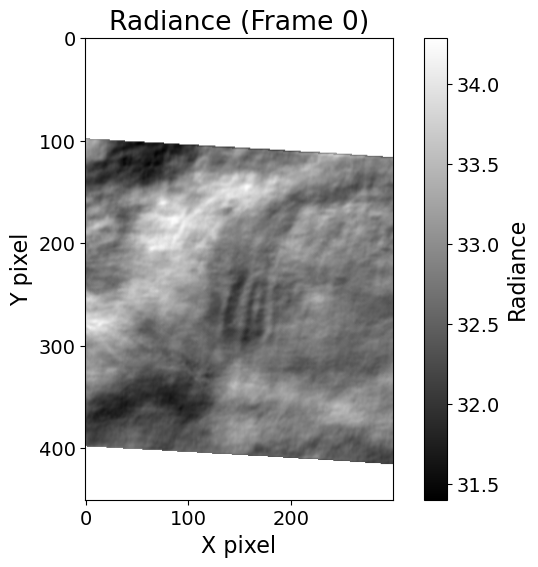

In [128]:
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import numpy as np

# Open the file (in the same folder as your notebook)
file_path = "awe_l5c_q20_2024098T1431_02132_v01.nc"
nc = Dataset(file_path, 'r')

# Read the radiance variable
radiance = nc.variables['Radiance'][:]
print("Radiance shape:", radiance.shape)

# Plot the first frame
plt.figure(figsize=(8, 6))
plt.imshow(radiance[0, :, 4300:4600], cmap='gray')
plt.title('Radiance (Frame 0)')

plt.colorbar(label='Radiance')
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

nc.close()


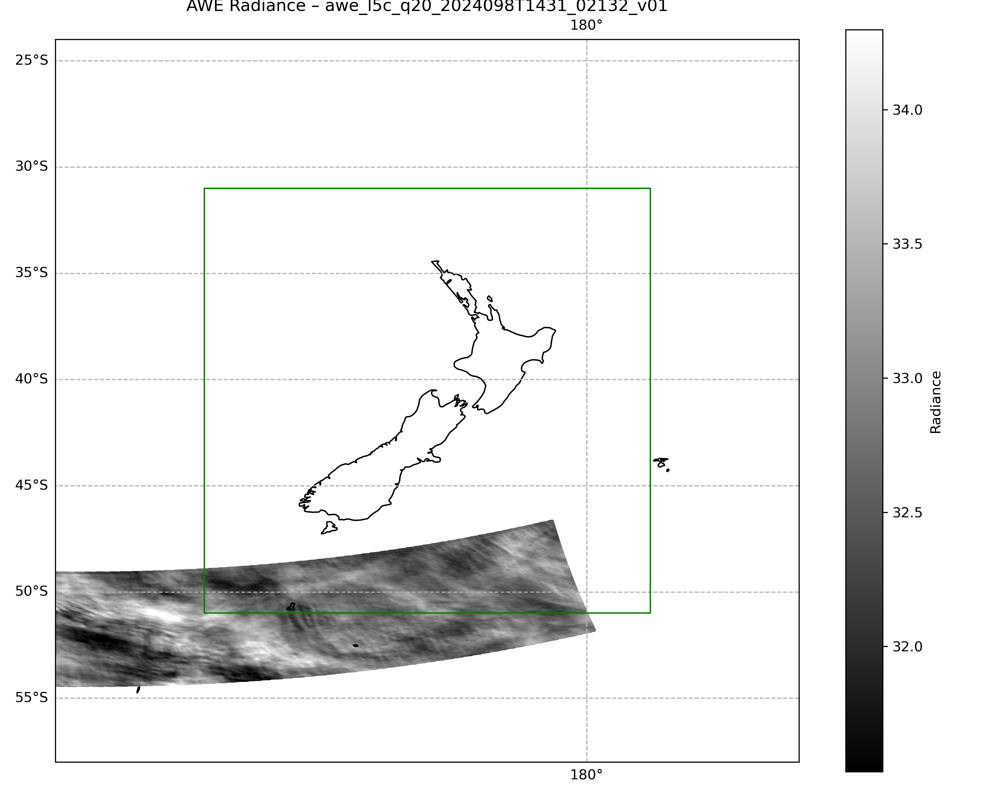

## Applying decompose2d to l5c radiance data

------------
cluster= 0
amplitude= 0.41874994434266566 idx= (np.int64(2), np.int64(9), np.int64(15), np.int64(102))
selected elements: 63977
------------
cluster= 1
amplitude= 0.38392840462607464 idx= (np.int64(5), np.int64(1), np.int64(117), np.int64(260))
selected elements: 84622
------------
cluster= 2
amplitude= 0.36042853571273015 idx= (np.int64(16), np.int64(7), np.int64(84), np.int64(142))
selected elements: 2217214
------------
cluster= 3
amplitude= 0.3526163417833829 idx= (np.int64(19), np.int64(3), np.int64(49), np.int64(235))
selected elements: 796080
------------
cluster= 4
amplitude= 0.35219600193548717 idx= (np.int64(15), np.int64(8), np.int64(95), np.int64(133))
selected elements: 202372
------------
cluster= 5
amplitude= 0.3193823298845195 idx= (np.int64(1), np.int64(0), np.int64(0), np.int64(125))
selected elements: 6970
------------
cluster= 6
amplitude= 0.31671249052556727 idx= (np.int64(9), np.int64(9), np.int64(32), np.int64(105))
selected elements: 79632
---------

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 70.72it/s]


Wave 0: peak amp = 0.419+0.000j, lamx=230958601836501056.0, lamy=14.1, lam=14.1
Wave 1: peak amp = 0.384+0.000j, lamx=24.2, lamy=137.0, lam=23.8


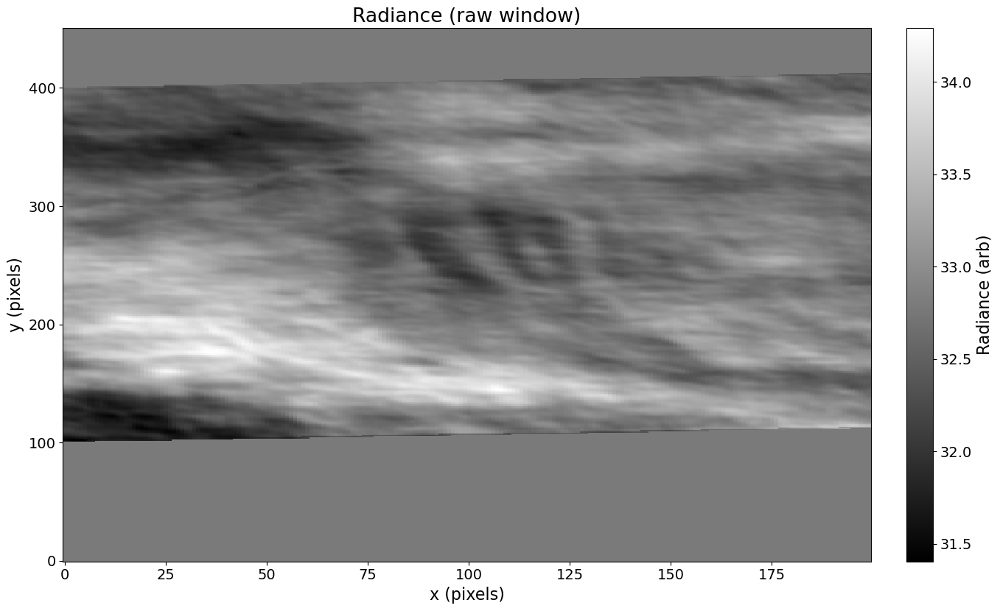

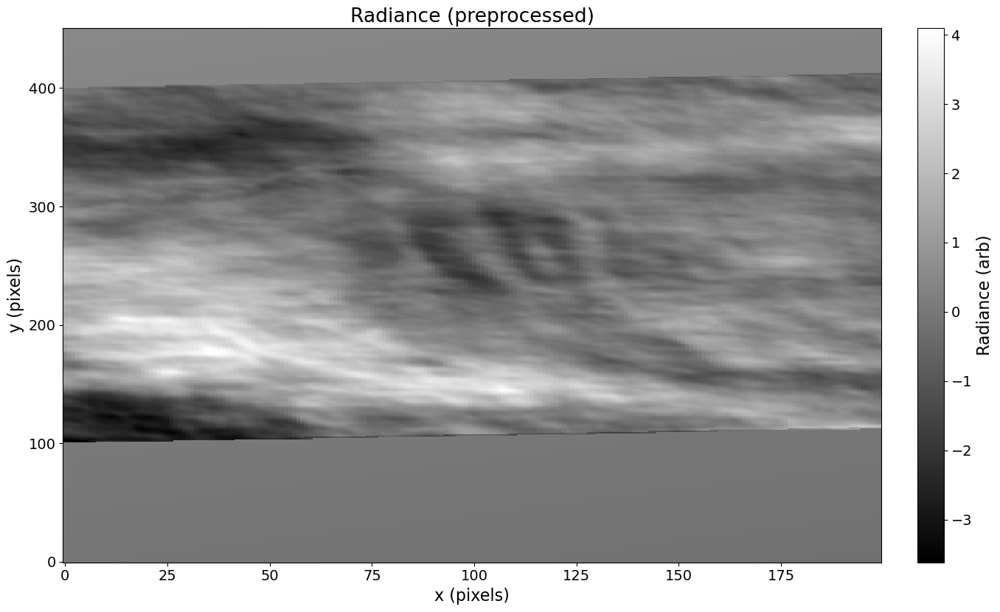

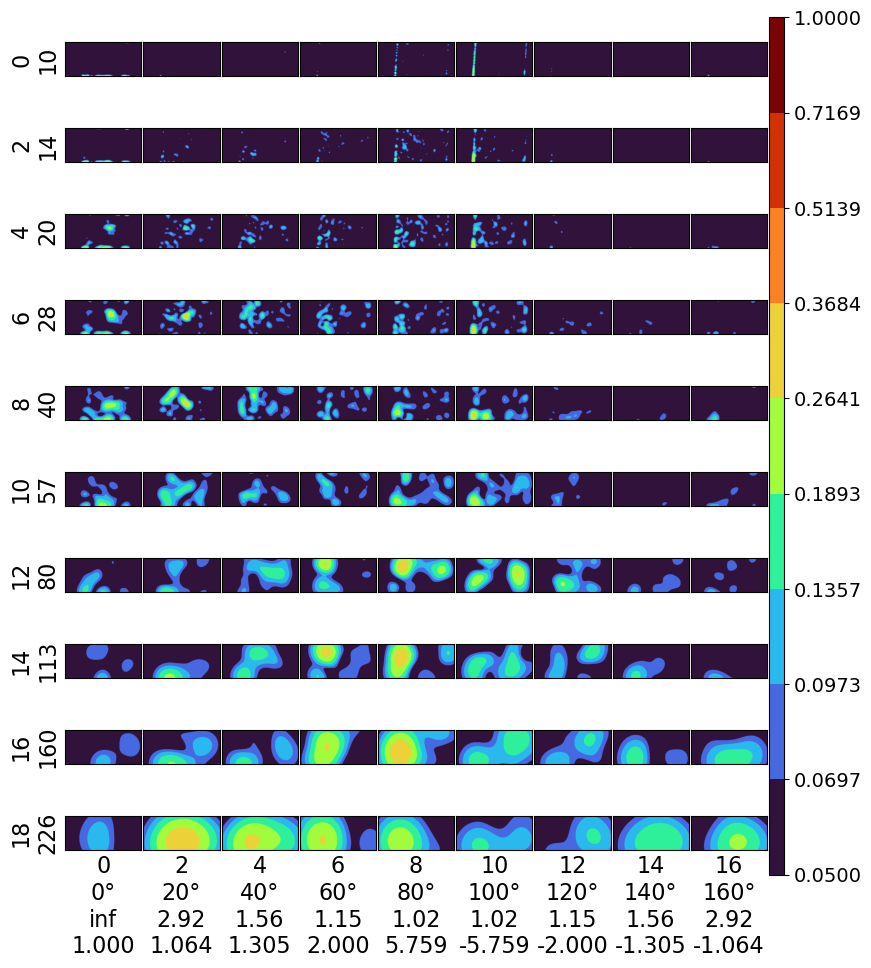

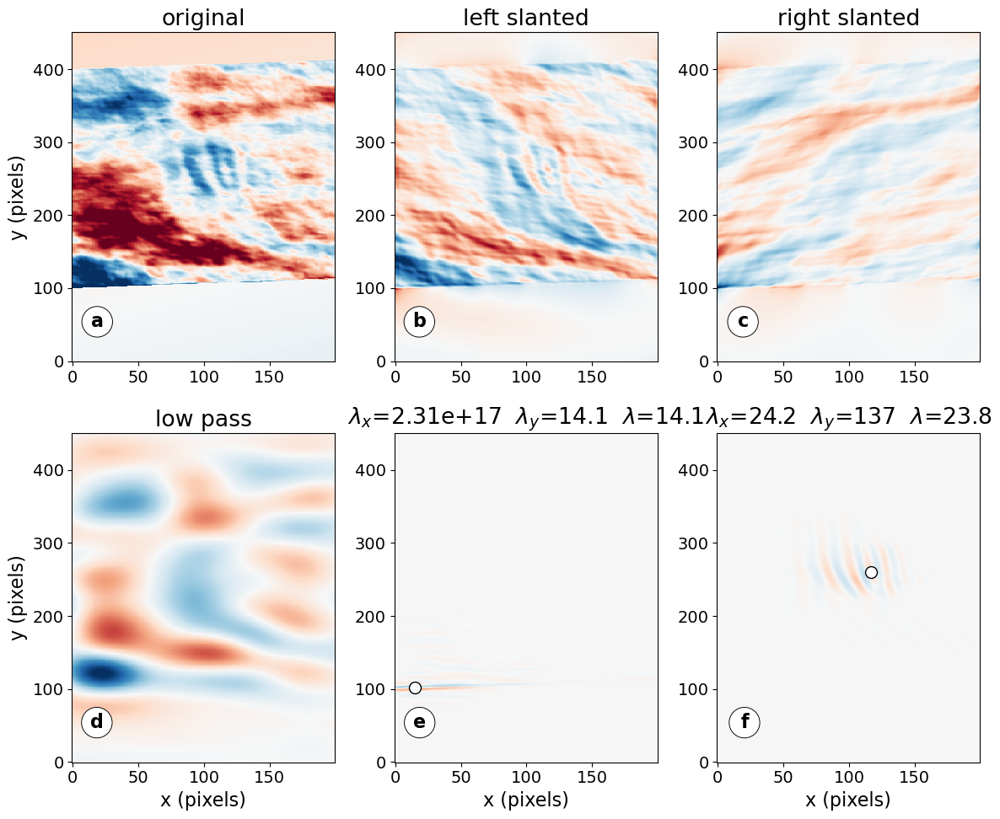

In [181]:
# example_decompose2d_from_nc.py
# Load a radiance window from an AWE NetCDF file, run juwavelet 2D CWT,
# and plot components. No files written.

from __future__ import annotations
import math
import string
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from typing import Tuple
from netCDF4 import Dataset

from juwavelet import transform, utils

# --------------------------
# User params
# --------------------------
FILE_PATH = "awe_l5c_q20_2024098T1431_02132_v01.nc"  # same folder as notebook/script
FRAME_IDX = 0
# Use pixels for now (unknown km/pixel). Adjust slices to taste.
X_SLICE = slice(4350, 4550)   # columns
Y_SLICE = slice(None, None)   # rows (all)

# Optional preprocessing
REMOVE_TREND = True      # subtract 2D plane (least-squares) before CWT
STANDARDIZE = True       # z-score to unit variance
GAUSS_BLUR_SIGMA = 0.0   # 0 disables, else pixels (e.g., 0.8)

# Wavelet params (tune if desired)
S0 = 10
DJ = 0.25
JS = 20
JT = 18
ASPECT = 1

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 16,
    "font.size": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.figsize": [2 * 6.94, 2 * 4.29],
})

# --------------------------
# Helpers
# --------------------------
def load_radiance_window(
    path: str,
    frame_idx: int,
    xsl: slice,
    ysl: slice,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Returns (x_coords, y_coords, window) with window shape (ny, nx).
    x/y are pixel indices starting at 0.
    """
    with Dataset(path, "r") as nc:
        rad = nc.variables["Radiance"][:]  # shape (nframe, ny, nx)
    if rad.ndim != 3:
        raise ValueError(f"Radiance expected 3D (t,y,x); got {rad.shape}")

    ny_full = rad.shape[1]
    nx_full = rad.shape[2]

    # Slicing
    win = np.asarray(rad[frame_idx, ysl, xsl], dtype=float)
    ny, nx = win.shape

    # coords in pixel units
    x = np.arange(nx, dtype=float)
    y = np.arange(ny, dtype=float)

    # Clean NaNs/Infs
    win = np.nan_to_num(win, nan=np.nanmedian(win), posinf=np.nanmedian(win), neginf=np.nanmedian(win))

    return x, y, win

def detrend_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit and remove a 2D plane ax + by + c from Z (least squares).
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return Z - plane

def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        # If SciPy isn't available, fall back to no blur
        return Z
    return gaussian_filter(Z, sigma=float(sigma))

def quicklook(x1d: np.ndarray, y1d: np.ndarray, Z: np.ndarray, title: str) -> None:
    fig, ax = plt.subplots()
    im = ax.pcolormesh(x1d, y1d, Z, shading="auto", cmap="gray")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label("Radiance (arb)")
    ax.set_xlabel("x (pixels)")
    ax.set_ylabel("y (pixels)")
    ax.set_title(title)
    plt.tight_layout()

# --------------------------
# Pipeline
# --------------------------
def run_pipeline():
    # Load a radiance window
    x1d, y1d, wave = load_radiance_window(FILE_PATH, FRAME_IDX, X_SLICE, Y_SLICE)

    # Show raw quicklook
    quicklook(x1d, y1d, wave, "Radiance (raw window)")

    # Preprocess
    proc = wave.copy()
    if REMOVE_TREND:
        proc = detrend_plane(proc)
    if STANDARDIZE:
        m = np.median(proc)
        s = np.std(proc)
        if s > 0:
            proc = (proc - m) / s
        else:
            proc = proc - m
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)

    quicklook(x1d, y1d, proc, "Radiance (preprocessed)")

    # Pixel spacing: 2 km/pixel
    dx = 2.0
    dy = 2.0

    # juwavelet expects (nx, ny); our arrays are (ny, nx) -> transpose
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=dx, dy=dy, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # Identify clusters
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=0.25, thr=0.1)

    decomposition, period, theta = [cwt[k] for k in ("decomposition", "period", "theta")]
    orig = decomposition.copy()

    # Overview CWT plot
    cmap = matplotlib.cm.turbo
    norm = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.05), np.log(1.0), 10)), cmap.N
    )
    fig1, _ = utils.plot_decomposition2d(cwt, redux_s=2, redux_t=2, cmap=cmap, norm=norm)

    # Component panels (same layout as before)
    fig2, axs = plt.subplots(2, 3, figsize=(12, 10))
    axs = axs.T  # (3, 2)
    opts = {"cmap": "RdBu_r", "vmin": -2.5, "vmax": 2.5, "rasterized": True}

    # original
    axs[0, 0].set_title("original")
    axs[0, 0].pcolormesh(x1d, y1d, proc, **opts)

    # left slanted (theta > pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (np.pi / 2 < theta)] = 0
    rec = transform.reconstruct2d(cwt)  # (nx, ny)
    axs[1, 0].set_title("left slanted")
    axs[1, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # right slanted (theta <= pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (theta <= np.pi / 2)] = 0
    rec = transform.reconstruct2d(cwt)
    axs[2, 0].set_title("right slanted")
    axs[2, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # low-pass (period >= 100 kept)
    decomposition[:] = orig
    decomposition[period < 100] = 0
    rec = transform.reconstruct2d(cwt)
    axs[0, 1].set_title("low pass")
    axs[0, 1].pcolormesh(x1d, y1d, rec.T, **opts)

    # highlight two identified waves (if present)
    demo_indices = [0, 1]
    targets = [(1, axs[1, 1]), (2, axs[2, 1])]

    def _fmt(v):
        if not np.isfinite(v):
            return "∞"
        v = float(v)
        if abs(v) >= 1000 or abs(v) < 0.1:
            return f"{v:.2e}"   # scientific notation
        elif abs(v) >= 100:
            return f"{v:.0f}"   # no decimals for big integers
        else:
            return f"{v:.1f}"   # one decimal for normal range

    for (demo_idx, (rowi, ax)) in zip(demo_indices, targets):
        if isinstance(idxs, (list, tuple)) and demo_idx < len(idxs):
            decomposition[:] = orig
            decomposition[iwave != demo_idx] = 0
            udx = idxs[demo_idx]  # (scale_index, angle_index)

            rec = transform.reconstruct2d(cwt)

            # component wavelengths
            lamx = cwt["wavelength_x"][udx[0], udx[1]]
            lamy = cwt["wavelength_y"][udx[0], udx[1]]

            # overall wavelength along k: λ = 1 / sqrt(λx^{-2} + λy^{-2})
            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.set_title(
                rf"$\lambda_x$={_fmt(lamx)}  "
                rf"$\lambda_y$={_fmt(lamy)}  "
                rf"$\lambda$={_fmt(lam)}"
            )
            ax.pcolormesh(x1d, y1d, rec.T, **opts)

            # mark peak location
            decomposition[:] = np.abs(decomposition)
            max_idx = np.unravel_index(
                decomposition[udx[0], udx[1]].argmax(), decomposition[0, 0].shape
            )
            ax.plot(x1d[max_idx[0]], y1d[max_idx[1]], "o", color="w", mec="k", ms=10)
            print(
                f"Wave {demo_idx}: peak amp = {decomposition[udx[0], udx[1]].max():.3f}, "
                f"lamx={lamx:.1f}, lamy={lamy:.1f}, lam={'inf' if not np.isfinite(lam) else f'{lam:.1f}'}"
            )
        else:
            ax.set_title(f"wave {demo_idx} not found")
            ax.axis("off")

    # labels
    for ax in axs[:, 1]:
        ax.set_xlabel("x (pixels)")
    for ax in axs[0, :]:
        ax.set_ylabel("y (pixels)")

    # letter tags
    letterbox = {"boxstyle": "circle", "lw": 0.67, "facecolor": "white", "edgecolor": "black"}
    for ax, letter in zip(axs.T.reshape(-1), string.ascii_lowercase):
        ax.text(0.12, 0.15, letter, transform=ax.transAxes,
                bbox=letterbox, va="top", ha="right", weight="bold")

    fig2.tight_layout()
    plt.show(fig1)
    plt.show(fig2)

# --------------------------
# Run
# --------------------------
if __name__ == "__main__":
    run_pipeline()


## Reading Radiance data, MW over Aucland Island orbit #2131

Radiance shape: (1, 451, 5201)


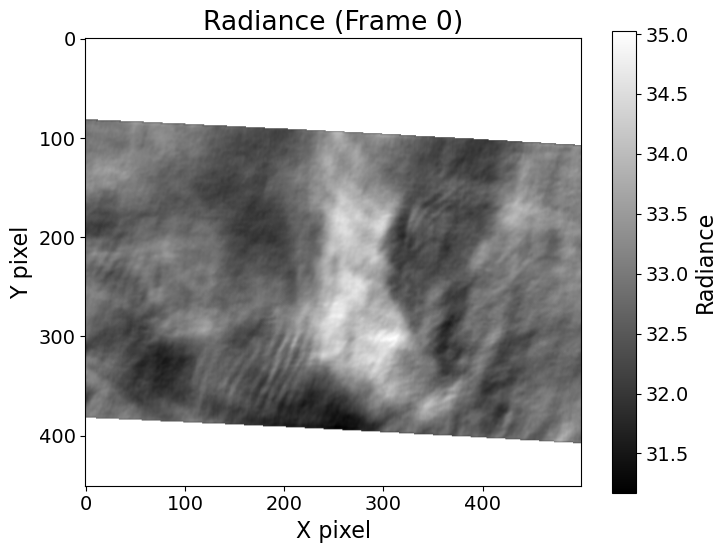

In [171]:
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import numpy as np

# Open the file (in the same folder as your notebook)
file_path = "awe_l5c_q20_2024098T1258_02131_v01.nc"
nc = Dataset(file_path, 'r')

# Read the radiance variable
radiance = nc.variables['Radiance'][:]
print("Radiance shape:", radiance.shape)

# Plot the first frame
plt.figure(figsize=(8, 6))
plt.imshow(radiance[0, :, 4000:4500], cmap='gray')
plt.title('Radiance (Frame 0)')

plt.colorbar(label='Radiance')
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

nc.close()


## Decompose2d 

C:\Users\domin\juwavelet\juwavelet\transform.py:324: RuntimeWarning: divide by zero encountered in divide
  wys = periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :]))
C:\Users\domin\juwavelet\juwavelet\transform.py:367: RuntimeWarning: divide by zero encountered in divide
  "wavelength_y": periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :])),


------------
cluster= 0
amplitude= 0.49276485534549164 idx= (np.int64(4), np.int64(2), np.int64(205), np.int64(311))
selected elements: 50065
------------
cluster= 1
amplitude= 0.44703021717961594 idx= (np.int64(19), np.int64(17), np.int64(254), np.int64(241))
selected elements: 1637280
------------
cluster= 2
amplitude= 0.4109722141832603 idx= (np.int64(1), np.int64(9), np.int64(250), np.int64(393))
selected elements: 106944
------------
cluster= 3
amplitude= 0.39471452619700353 idx= (np.int64(19), np.int64(0), np.int64(253), np.int64(224))
selected elements: 1747671
------------
cluster= 4
amplitude= 0.39382573850261343 idx= (np.int64(19), np.int64(11), np.int64(227), np.int64(320))
selected elements: 3224136
------------
cluster= 5
amplitude= 0.3709972106398537 idx= (np.int64(12), np.int64(2), np.int64(291), np.int64(189))
selected elements: 1505473
------------
cluster= 6
amplitude= 0.35487119854001026 idx= (np.int64(9), np.int64(9), np.int64(253), np.int64(393))
selected elements:

C:\Users\domin\juwavelet\juwavelet\utils.py:62: RuntimeWarning: divide by zero encountered in scalar divide
  hl = 1. / np.sin(theta[sel_t[j]])
100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 41.14it/s]
C:\Users\domin\juwavelet\juwavelet\utils.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Wave 0: peak amp = 0.493+0.000j, lamx=21.3, lamy=58.5, lam=20.0
Wave 1: peak amp = 0.447+0.000j, lamx=-273.2, lamy=1549.6, lam=269.1


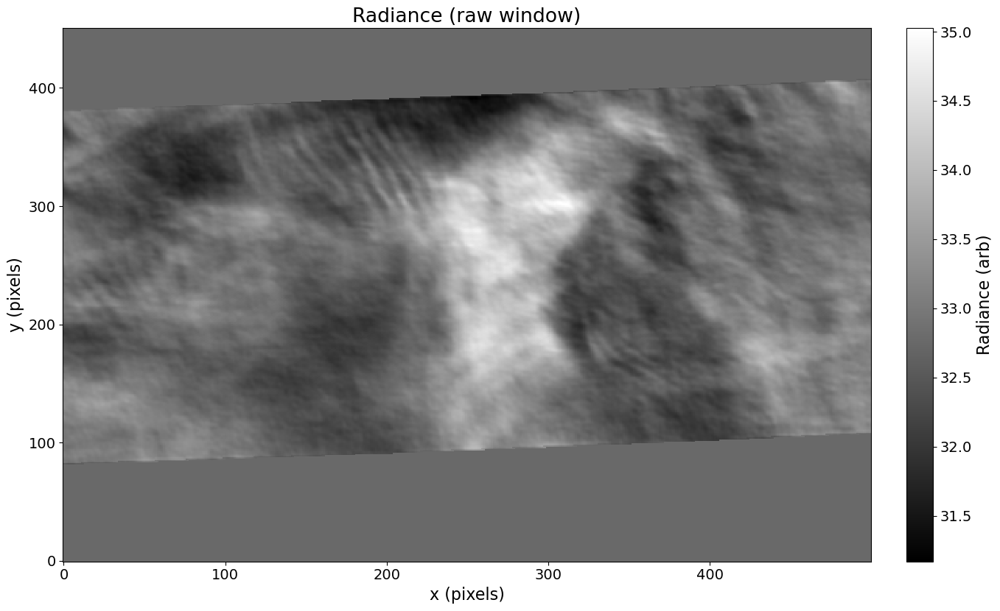

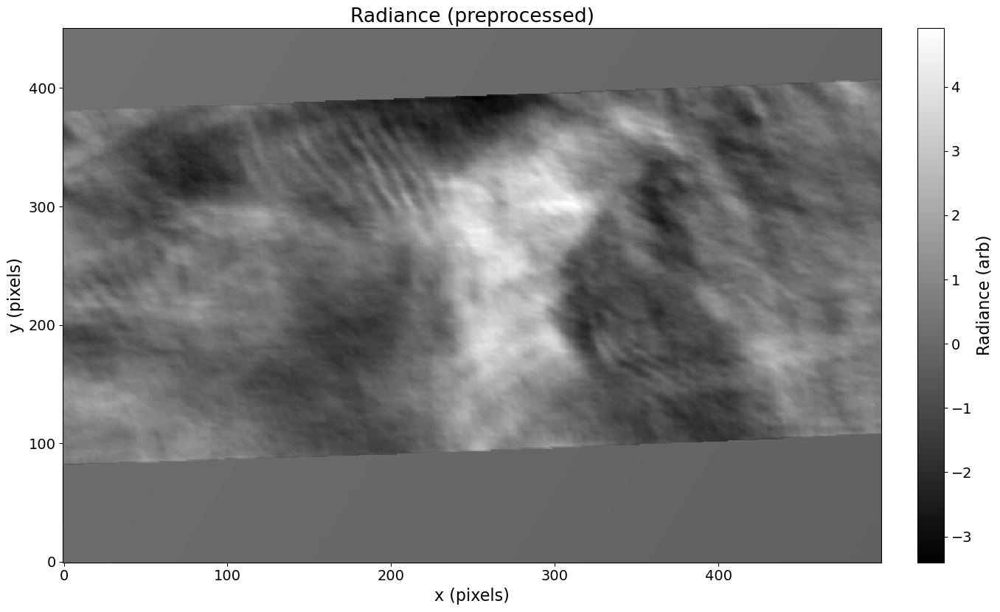

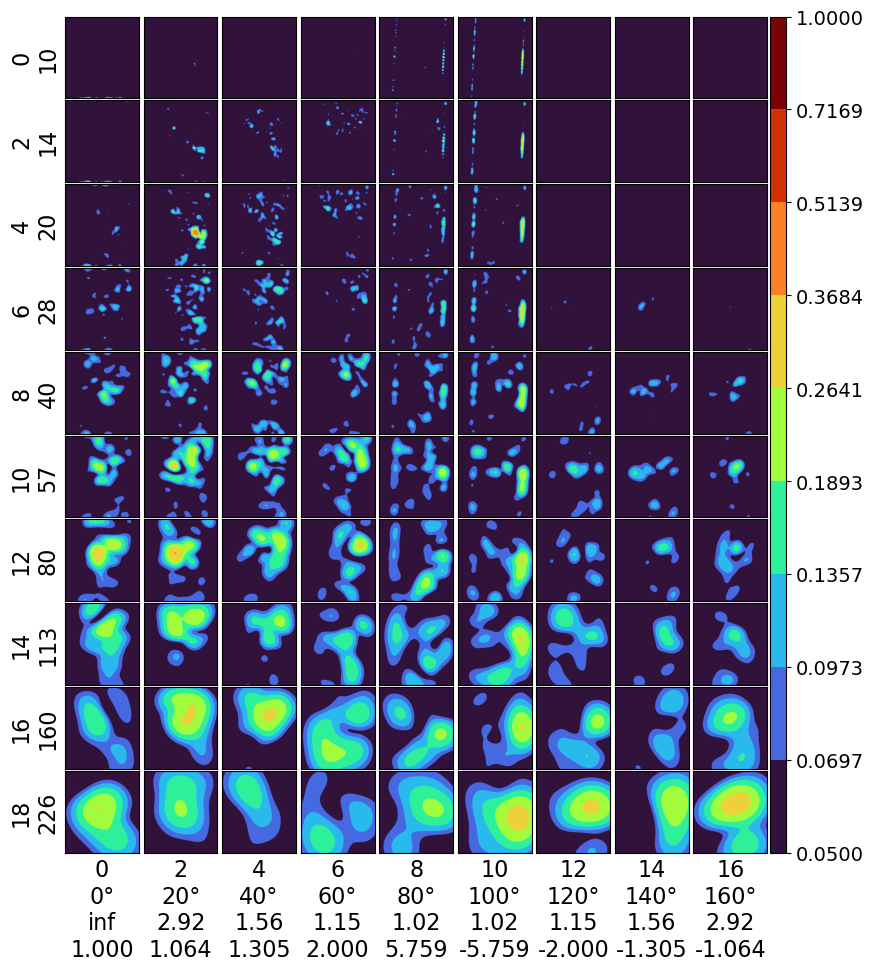

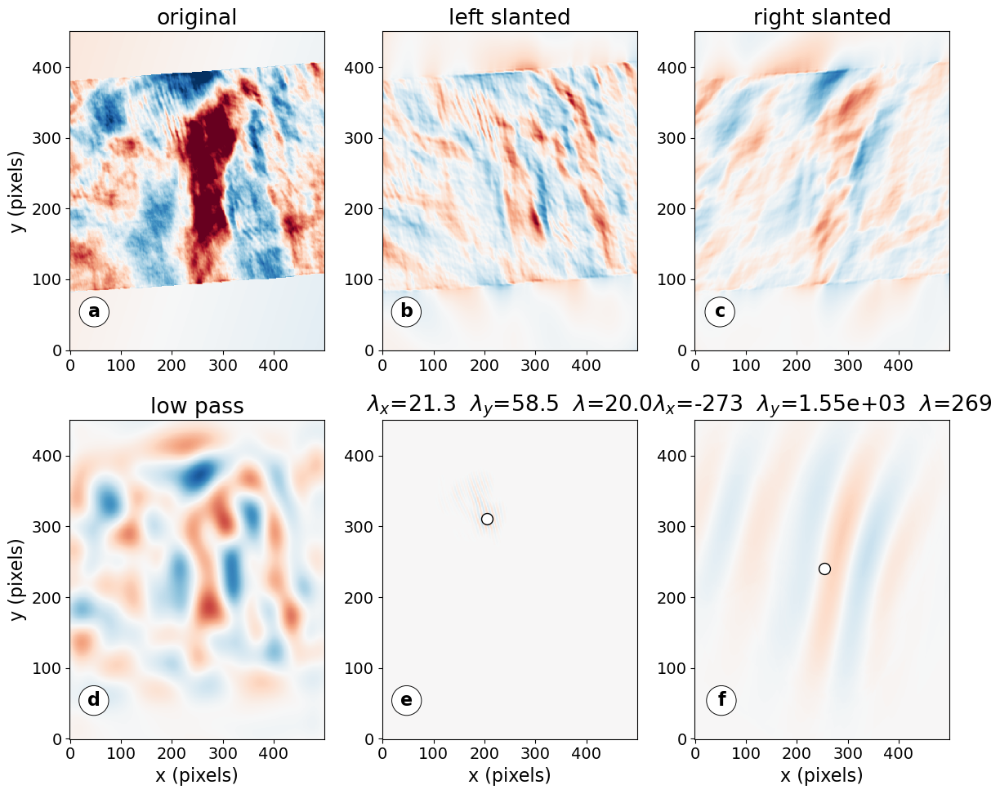

In [14]:
# example_decompose2d_from_nc.py
# Load a radiance window from an AWE NetCDF file, run juwavelet 2D CWT,
# and plot components. No files written.

from __future__ import annotations
import math
import string
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from typing import Tuple
from netCDF4 import Dataset

from juwavelet import transform, utils

# --------------------------
# User params
# --------------------------
FILE_PATH = "awe_l5c_q20_2024098T1258_02131_v01.nc"  # same folder as notebook/script
FRAME_IDX = 0
# Use pixels for now (unknown km/pixel). Adjust slices to taste.
X_SLICE = slice(4000, 4500)   # columns
Y_SLICE = slice(None, None)   # rows (all)

# Optional preprocessing
REMOVE_TREND = True      # subtract 2D plane (least-squares) before CWT
STANDARDIZE = True       # z-score to unit variance
GAUSS_BLUR_SIGMA = 0.0   # 0 disables, else pixels (e.g., 0.8)

# Wavelet params (tune if desired)
S0 = 10
DJ = 0.25
JS = 20
JT = 18
ASPECT = 1

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 16,
    "font.size": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.figsize": [2 * 6.94, 2 * 4.29],
})

# --------------------------
# Helpers
# --------------------------
def load_radiance_window(
    path: str,
    frame_idx: int,
    xsl: slice,
    ysl: slice,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Returns (x_coords, y_coords, window) with window shape (ny, nx).
    x/y are pixel indices starting at 0.
    """
    with Dataset(path, "r") as nc:
        rad = nc.variables["Radiance"][:]  # shape (nframe, ny, nx)
    if rad.ndim != 3:
        raise ValueError(f"Radiance expected 3D (t,y,x); got {rad.shape}")

    ny_full = rad.shape[1]
    nx_full = rad.shape[2]

    # Slicing
    win = np.asarray(rad[frame_idx, ysl, xsl], dtype=float)
    ny, nx = win.shape

    # coords in pixel units
    x = np.arange(nx, dtype=float)
    y = np.arange(ny, dtype=float)

    # Clean NaNs/Infs
    win = np.nan_to_num(win, nan=np.nanmedian(win), posinf=np.nanmedian(win), neginf=np.nanmedian(win))

    return x, y, win

def detrend_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit and remove a 2D plane ax + by + c from Z (least squares).
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return Z - plane

def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        # If SciPy isn't available, fall back to no blur
        return Z
    return gaussian_filter(Z, sigma=float(sigma))

def quicklook(x1d: np.ndarray, y1d: np.ndarray, Z: np.ndarray, title: str) -> None:
    fig, ax = plt.subplots()
    im = ax.pcolormesh(x1d, y1d, Z, shading="auto", cmap="gray")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label("Radiance (arb)")
    ax.set_xlabel("x (pixels)")
    ax.set_ylabel("y (pixels)")
    ax.set_title(title)
    plt.tight_layout()

# --------------------------
# Pipeline
# --------------------------
def run_pipeline():
    # Load a radiance window
    x1d, y1d, wave = load_radiance_window(FILE_PATH, FRAME_IDX, X_SLICE, Y_SLICE)

    # Show raw quicklook
    quicklook(x1d, y1d, wave, "Radiance (raw window)")

    # Preprocess
    proc = wave.copy()
    if REMOVE_TREND:
        proc = detrend_plane(proc)
    if STANDARDIZE:
        m = np.median(proc)
        s = np.std(proc)
        if s > 0:
            proc = (proc - m) / s
        else:
            proc = proc - m
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)

    quicklook(x1d, y1d, proc, "Radiance (preprocessed)")

    # Pixel spacing: 2 km/pixel
    dx = 2.0
    dy = 2.0

    # juwavelet expects (nx, ny); our arrays are (ny, nx) -> transpose
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=dx, dy=dy, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # Identify clusters
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=0.25, thr=0.1)

    decomposition, period, theta = [cwt[k] for k in ("decomposition", "period", "theta")]
    orig = decomposition.copy()

    # Overview CWT plot
    cmap = matplotlib.cm.turbo
    norm = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.05), np.log(1.0), 10)), cmap.N
    )
    fig1, _ = utils.plot_decomposition2d(cwt, redux_s=2, redux_t=2, cmap=cmap, norm=norm)

    # Component panels (same layout as before)
    fig2, axs = plt.subplots(2, 3, figsize=(12, 10))
    axs = axs.T  # (3, 2)
    opts = {"cmap": "RdBu_r", "vmin": -2.5, "vmax": 2.5, "rasterized": True}

    # original
    axs[0, 0].set_title("original")
    axs[0, 0].pcolormesh(x1d, y1d, proc, **opts)

    # left slanted (theta > pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (np.pi / 2 < theta)] = 0
    rec = transform.reconstruct2d(cwt)  # (nx, ny)
    axs[1, 0].set_title("left slanted")
    axs[1, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # right slanted (theta <= pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (theta <= np.pi / 2)] = 0
    rec = transform.reconstruct2d(cwt)
    axs[2, 0].set_title("right slanted")
    axs[2, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # low-pass (period >= 100 kept)
    decomposition[:] = orig
    decomposition[period < 100] = 0
    rec = transform.reconstruct2d(cwt)
    axs[0, 1].set_title("low pass")
    axs[0, 1].pcolormesh(x1d, y1d, rec.T, **opts)

    # highlight two identified waves (if present)
    demo_indices = [0, 1]
    targets = [(1, axs[1, 1]), (2, axs[2, 1])]

    def _fmt(v):
        if not np.isfinite(v):
            return "∞"
        v = float(v)
        if abs(v) >= 1000 or abs(v) < 0.1:
            return f"{v:.2e}"   # scientific notation
        elif abs(v) >= 100:
            return f"{v:.0f}"   # no decimals for big integers
        else:
            return f"{v:.1f}"   # one decimal for normal range

    for (demo_idx, (rowi, ax)) in zip(demo_indices, targets):
        if isinstance(idxs, (list, tuple)) and demo_idx < len(idxs):
            decomposition[:] = orig
            decomposition[iwave != demo_idx] = 0
            udx = idxs[demo_idx]  # (scale_index, angle_index)

            rec = transform.reconstruct2d(cwt)

            # component wavelengths
            lamx = cwt["wavelength_x"][udx[0], udx[1]]
            lamy = cwt["wavelength_y"][udx[0], udx[1]]

            # overall wavelength along k: λ = 1 / sqrt(λx^{-2} + λy^{-2})
            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.set_title(
                rf"$\lambda_x$={_fmt(lamx)}  "
                rf"$\lambda_y$={_fmt(lamy)}  "
                rf"$\lambda$={_fmt(lam)}"
            )
            ax.pcolormesh(x1d, y1d, rec.T, **opts)

            # mark peak location
            decomposition[:] = np.abs(decomposition)
            max_idx = np.unravel_index(
                decomposition[udx[0], udx[1]].argmax(), decomposition[0, 0].shape
            )
            ax.plot(x1d[max_idx[0]], y1d[max_idx[1]], "o", color="w", mec="k", ms=10)
            print(
                f"Wave {demo_idx}: peak amp = {decomposition[udx[0], udx[1]].max():.3f}, "
                f"lamx={lamx:.1f}, lamy={lamy:.1f}, lam={'inf' if not np.isfinite(lam) else f'{lam:.1f}'}"
            )
        else:
            ax.set_title(f"wave {demo_idx} not found")
            ax.axis("off")


    # labels
    for ax in axs[:, 1]:
        ax.set_xlabel("x (pixels)")
    for ax in axs[0, :]:
        ax.set_ylabel("y (pixels)")

    # letter tags
    letterbox = {"boxstyle": "circle", "lw": 0.67, "facecolor": "white", "edgecolor": "black"}
    for ax, letter in zip(axs.T.reshape(-1), string.ascii_lowercase):
        ax.text(0.12, 0.15, letter, transform=ax.transAxes,
                bbox=letterbox, va="top", ha="right", weight="bold")

    fig2.tight_layout()
    plt.show(fig1)
    plt.show(fig2)

# --------------------------
# Run
# --------------------------
if __name__ == "__main__":
    run_pipeline()

## Try on some concentric waves, orbit #01756

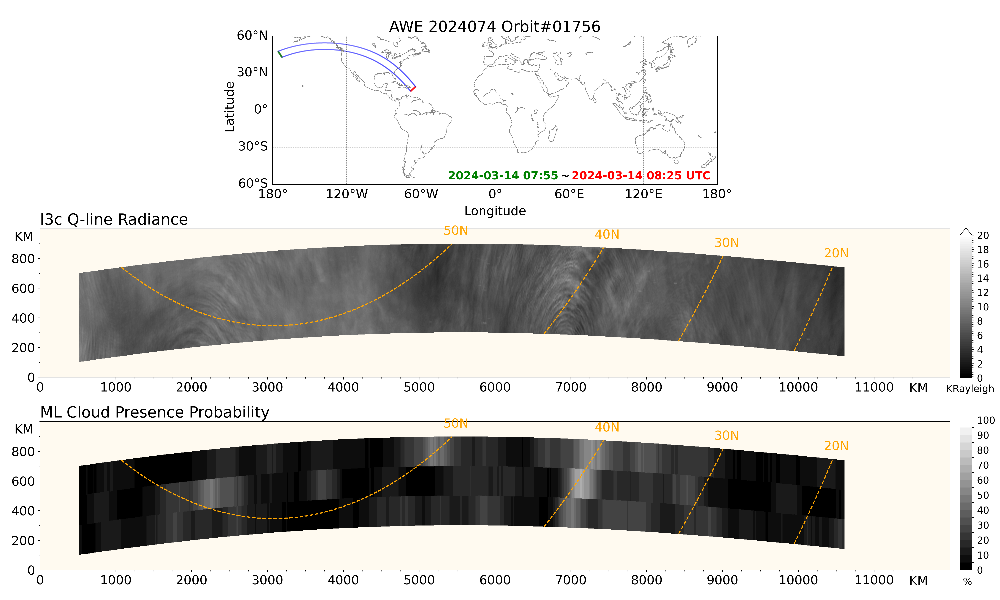

------------
cluster= 0
amplitude= 1.0252554382976722 idx= (np.int64(8), np.int64(11), np.int64(428), np.int64(220))
selected elements: 4620234
------------
cluster= 1
amplitude= 0.8286693982246465 idx= (np.int64(5), np.int64(9), np.int64(500), np.int64(380))
selected elements: 101568
------------
cluster= 2
amplitude= 0.7891067417751223 idx= (np.int64(5), np.int64(5), np.int64(545), np.int64(157))
selected elements: 572477
------------
cluster= 3
amplitude= 0.7493733082080895 idx= (np.int64(8), np.int64(8), np.int64(495), np.int64(221))
selected elements: 92313
------------
cluster= 4
amplitude= 0.6570109387550415 idx= (np.int64(4), np.int64(13), np.int64(381), np.int64(307))
selected elements: 421999
------------
cluster= 5
amplitude= 0.6028490325693364 idx= (np.int64(12), np.int64(7), np.int64(571), np.int64(306))
selected elements: 934693
------------
cluster= 6
amplitude= 0.6017819283478256 idx= (np.int64(11), np.int64(6), np.int64(602), np.int64(317))
selected elements: 94509
---

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 19.73it/s]


Wave 0: peak amp = 1.025+0.000j, lamx=-117.0, lamy=42.6, lam=40.0
Wave 1: peak amp = 0.829+0.000j, lamx=388424520712647360.0, lamy=23.8, lam=23.8


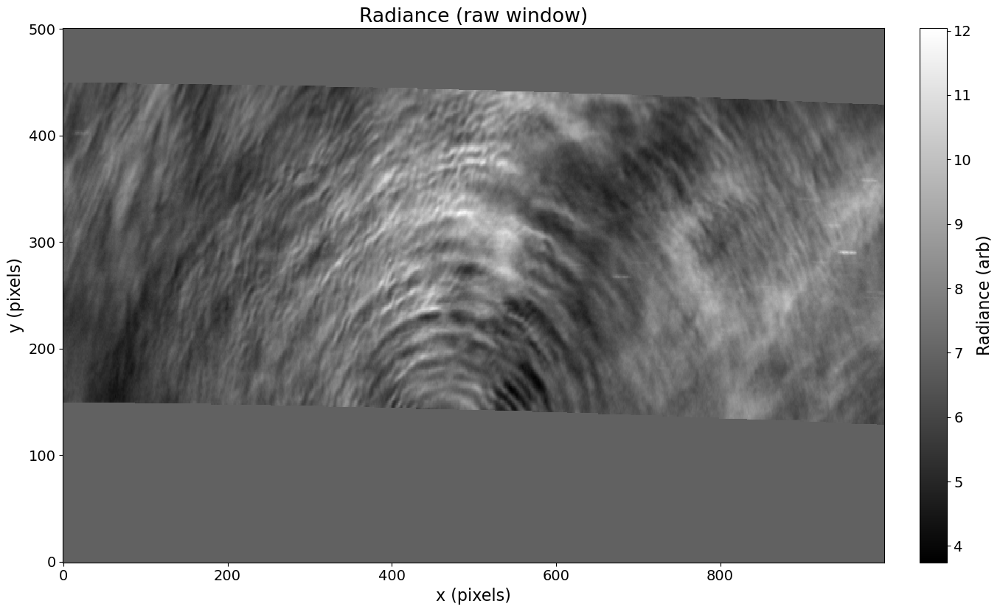

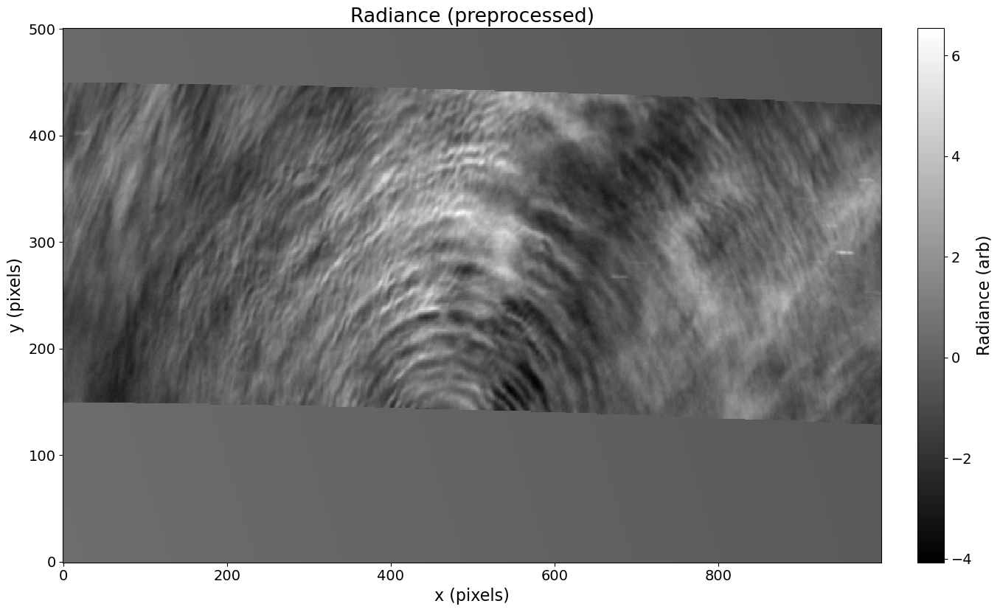

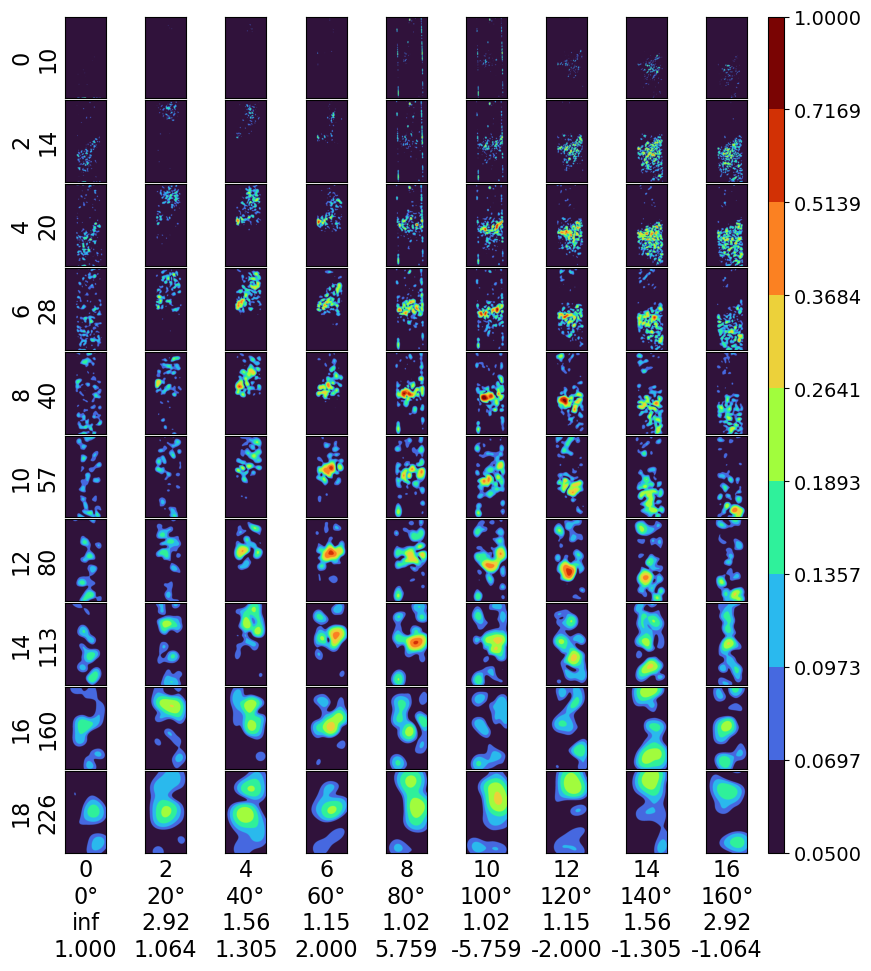

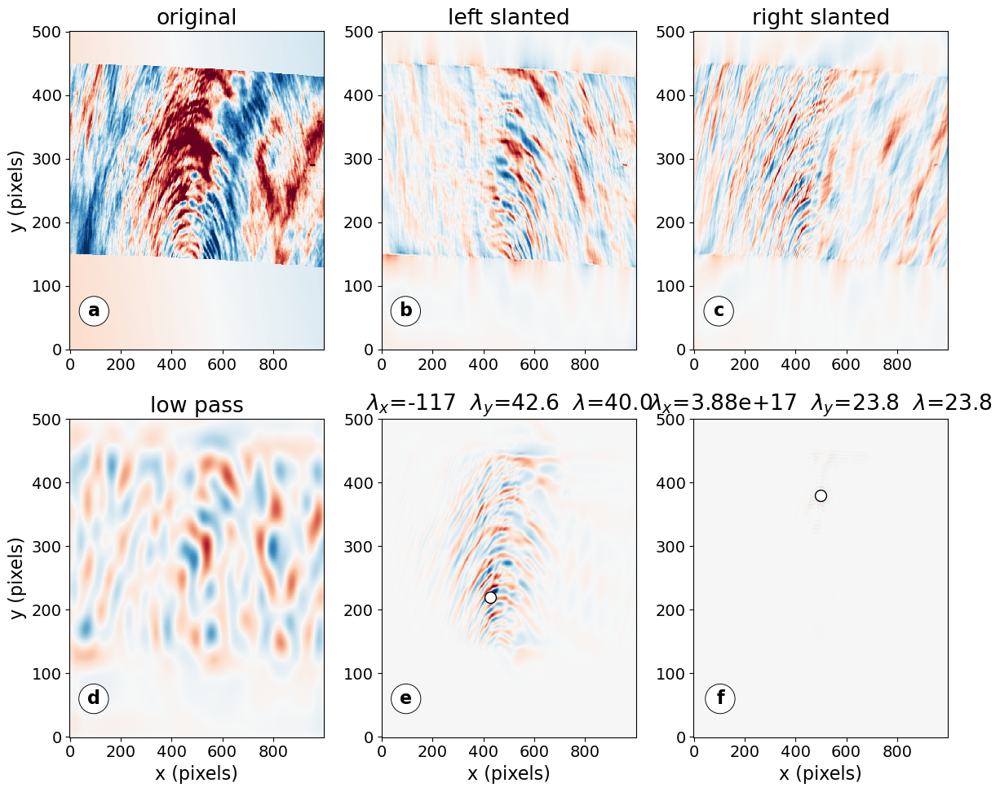

In [186]:
# example_decompose2d_from_nc.py
# Load a radiance window from an AWE NetCDF file, run juwavelet 2D CWT,
# and plot components. No files written.

from __future__ import annotations
import math
import string
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from typing import Tuple
from netCDF4 import Dataset

from juwavelet import transform, utils

# --------------------------
# User params
# --------------------------
FILE_PATH = "awe_l3c_q20_2024074T0757_01756_v01.nc"  # same folder as notebook/script
FRAME_IDX = 0
# Use pixels for now (unknown km/pixel). Adjust slices to taste.
X_SLICE = slice(3000, 4000)   # columns
Y_SLICE = slice(None, None)   # rows (all)

# Optional preprocessing
REMOVE_TREND = True      # subtract 2D plane (least-squares) before CWT
STANDARDIZE = True       # z-score to unit variance
GAUSS_BLUR_SIGMA = 0.0   # 0 disables, else pixels (e.g., 0.8)

# Wavelet params (tune if desired)
S0 = 10
DJ = 0.25
JS = 20
JT = 18
ASPECT = 1

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 16,
    "font.size": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.figsize": [2 * 6.94, 2 * 4.29],
})

# --------------------------
# Helpers
# --------------------------
def load_radiance_window(
    path: str,
    frame_idx: int,
    xsl: slice,
    ysl: slice,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Returns (x_coords, y_coords, window) with window shape (ny, nx).
    x/y are pixel indices starting at 0.
    """
    with Dataset(path, "r") as nc:
        rad = nc.variables["Radiance"][:]  # shape (nframe, ny, nx)
    if rad.ndim != 3:
        raise ValueError(f"Radiance expected 3D (t,y,x); got {rad.shape}")

    ny_full = rad.shape[1]
    nx_full = rad.shape[2]

    # Slicing
    win = np.asarray(rad[frame_idx, ysl, xsl], dtype=float)
    ny, nx = win.shape

    # coords in pixel units
    x = np.arange(nx, dtype=float)
    y = np.arange(ny, dtype=float)

    # Clean NaNs/Infs
    win = np.nan_to_num(win, nan=np.nanmedian(win), posinf=np.nanmedian(win), neginf=np.nanmedian(win))

    return x, y, win

def detrend_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit and remove a 2D plane ax + by + c from Z (least squares).
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return Z - plane

def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        # If SciPy isn't available, fall back to no blur
        return Z
    return gaussian_filter(Z, sigma=float(sigma))

def quicklook(x1d: np.ndarray, y1d: np.ndarray, Z: np.ndarray, title: str) -> None:
    fig, ax = plt.subplots()
    im = ax.pcolormesh(x1d, y1d, Z, shading="auto", cmap="gray")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label("Radiance (arb)")
    ax.set_xlabel("x (pixels)")
    ax.set_ylabel("y (pixels)")
    ax.set_title(title)
    plt.tight_layout()

# --------------------------
# Pipeline
# --------------------------
def run_pipeline():
    # Load a radiance window
    x1d, y1d, wave = load_radiance_window(FILE_PATH, FRAME_IDX, X_SLICE, Y_SLICE)

    # Show raw quicklook
    quicklook(x1d, y1d, wave, "Radiance (raw window)")

    # Preprocess
    proc = wave.copy()
    if REMOVE_TREND:
        proc = detrend_plane(proc)
    if STANDARDIZE:
        m = np.median(proc)
        s = np.std(proc)
        if s > 0:
            proc = (proc - m) / s
        else:
            proc = proc - m
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)

    quicklook(x1d, y1d, proc, "Radiance (preprocessed)")

    # Pixel spacing: 2 km/pixel
    dx = 2.0
    dy = 2.0

    # juwavelet expects (nx, ny); our arrays are (ny, nx) -> transpose
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=dx, dy=dy, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # Identify clusters
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=0.25, thr=0.1)

    decomposition, period, theta = [cwt[k] for k in ("decomposition", "period", "theta")]
    orig = decomposition.copy()

    # Overview CWT plot
    cmap = matplotlib.cm.turbo
    norm = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.05), np.log(1.0), 10)), cmap.N
    )
    fig1, _ = utils.plot_decomposition2d(cwt, redux_s=2, redux_t=2, cmap=cmap, norm=norm)

    # Component panels (same layout as before)
    fig2, axs = plt.subplots(2, 3, figsize=(12, 10))
    axs = axs.T  # (3, 2)
    opts = {"cmap": "RdBu_r", "vmin": -2.5, "vmax": 2.5, "rasterized": True}

    # original
    axs[0, 0].set_title("original")
    axs[0, 0].pcolormesh(x1d, y1d, proc, **opts)

    # left slanted (theta > pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (np.pi / 2 < theta)] = 0
    rec = transform.reconstruct2d(cwt)  # (nx, ny)
    axs[1, 0].set_title("left slanted")
    axs[1, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # right slanted (theta <= pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (theta <= np.pi / 2)] = 0
    rec = transform.reconstruct2d(cwt)
    axs[2, 0].set_title("right slanted")
    axs[2, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # low-pass (period >= 100 kept)
    decomposition[:] = orig
    decomposition[period < 100] = 0
    rec = transform.reconstruct2d(cwt)
    axs[0, 1].set_title("low pass")
    axs[0, 1].pcolormesh(x1d, y1d, rec.T, **opts)

    # highlight two identified waves (if present)
    demo_indices = [0, 1]
    targets = [(1, axs[1, 1]), (2, axs[2, 1])]

    def _fmt(v):
        if not np.isfinite(v):
            return "∞"
        v = float(v)
        if abs(v) >= 1000 or abs(v) < 0.1:
            return f"{v:.2e}"   # scientific notation
        elif abs(v) >= 100:
            return f"{v:.0f}"   # no decimals for big integers
        else:
            return f"{v:.1f}"   # one decimal for normal range

    for (demo_idx, (rowi, ax)) in zip(demo_indices, targets):
        if isinstance(idxs, (list, tuple)) and demo_idx < len(idxs):
            decomposition[:] = orig
            decomposition[iwave != demo_idx] = 0
            udx = idxs[demo_idx]  # (scale_index, angle_index)

            rec = transform.reconstruct2d(cwt)

            # component wavelengths
            lamx = cwt["wavelength_x"][udx[0], udx[1]]
            lamy = cwt["wavelength_y"][udx[0], udx[1]]

            # overall wavelength along k: λ = 1 / sqrt(λx^{-2} + λy^{-2})
            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.set_title(
                rf"$\lambda_x$={_fmt(lamx)}  "
                rf"$\lambda_y$={_fmt(lamy)}  "
                rf"$\lambda$={_fmt(lam)}"
            )
            ax.pcolormesh(x1d, y1d, rec.T, **opts)

            # mark peak location
            decomposition[:] = np.abs(decomposition)
            max_idx = np.unravel_index(
                decomposition[udx[0], udx[1]].argmax(), decomposition[0, 0].shape
            )
            ax.plot(x1d[max_idx[0]], y1d[max_idx[1]], "o", color="w", mec="k", ms=10)
            print(
                f"Wave {demo_idx}: peak amp = {decomposition[udx[0], udx[1]].max():.3f}, "
                f"lamx={lamx:.1f}, lamy={lamy:.1f}, lam={'inf' if not np.isfinite(lam) else f'{lam:.1f}'}"
            )
        else:
            ax.set_title(f"wave {demo_idx} not found")
            ax.axis("off")


    # labels
    for ax in axs[:, 1]:
        ax.set_xlabel("x (pixels)")
    for ax in axs[0, :]:
        ax.set_ylabel("y (pixels)")

    # letter tags
    letterbox = {"boxstyle": "circle", "lw": 0.67, "facecolor": "white", "edgecolor": "black"}
    for ax, letter in zip(axs.T.reshape(-1), string.ascii_lowercase):
        ax.text(0.12, 0.15, letter, transform=ax.transAxes,
                bbox=letterbox, va="top", ha="right", weight="bold")

    fig2.tight_layout()
    plt.show(fig1)
    plt.show(fig2)

# --------------------------
# Run
# --------------------------
if __name__ == "__main__":
    run_pipeline()


## Plotting per-pixel amplitude, wavelength, and orientation

------------
cluster= 0
amplitude= 1.0252554382976722 idx= (np.int64(8), np.int64(11), np.int64(428), np.int64(220))
selected elements: 4620234
------------
cluster= 1
amplitude= 0.8286693982246465 idx= (np.int64(5), np.int64(9), np.int64(500), np.int64(380))
selected elements: 101568
------------
cluster= 2
amplitude= 0.7891067417751223 idx= (np.int64(5), np.int64(5), np.int64(545), np.int64(157))
selected elements: 572477
------------
cluster= 3
amplitude= 0.7493733082080895 idx= (np.int64(8), np.int64(8), np.int64(495), np.int64(221))
selected elements: 92313
------------
cluster= 4
amplitude= 0.6570109387550415 idx= (np.int64(4), np.int64(13), np.int64(381), np.int64(307))
selected elements: 421999
------------
cluster= 5
amplitude= 0.6028490325693364 idx= (np.int64(12), np.int64(7), np.int64(571), np.int64(306))
selected elements: 934693
------------
cluster= 6
amplitude= 0.6017819283478256 idx= (np.int64(11), np.int64(6), np.int64(602), np.int64(317))
selected elements: 94509
---

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 28.18it/s]


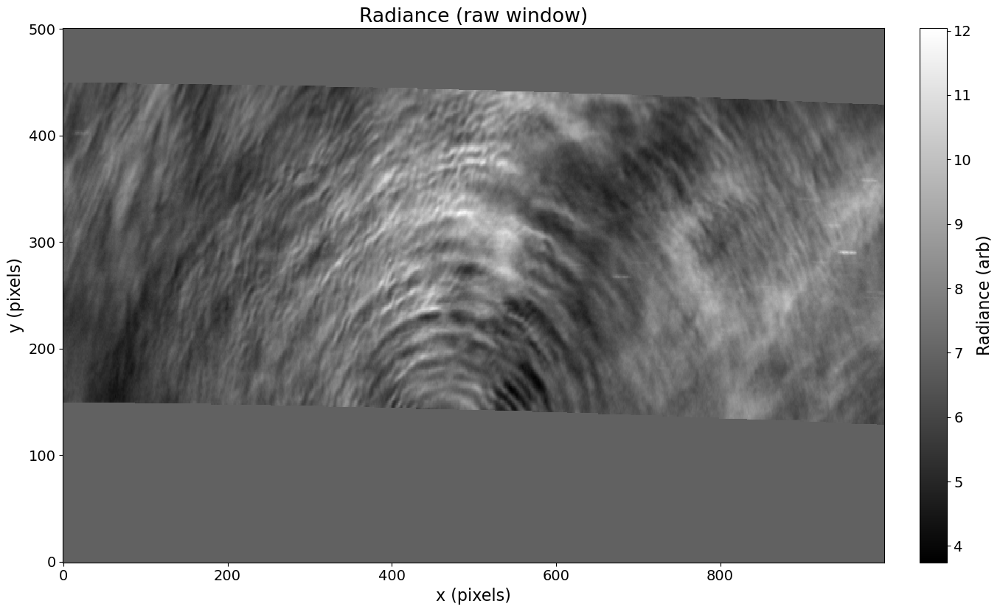

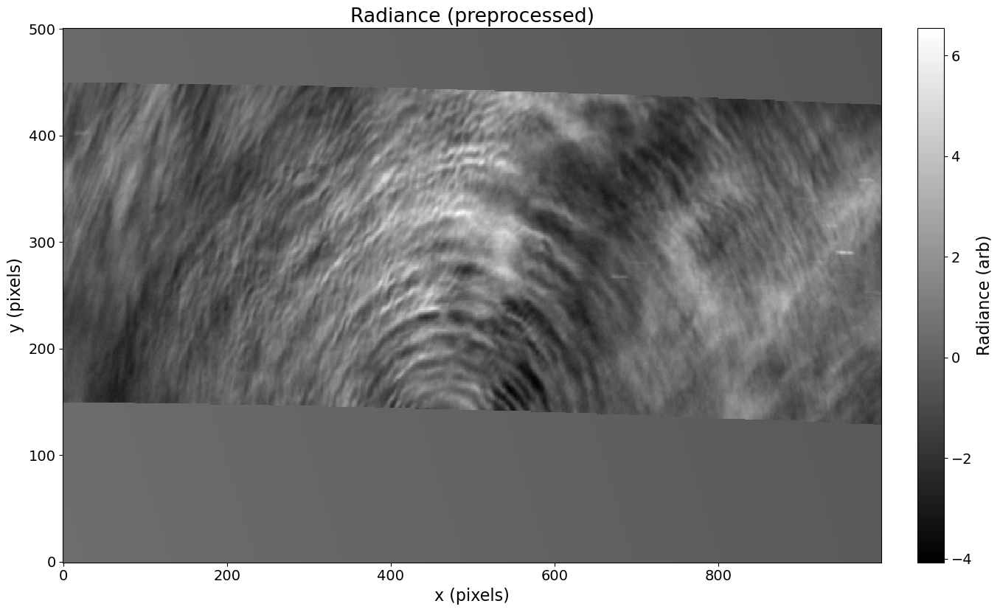

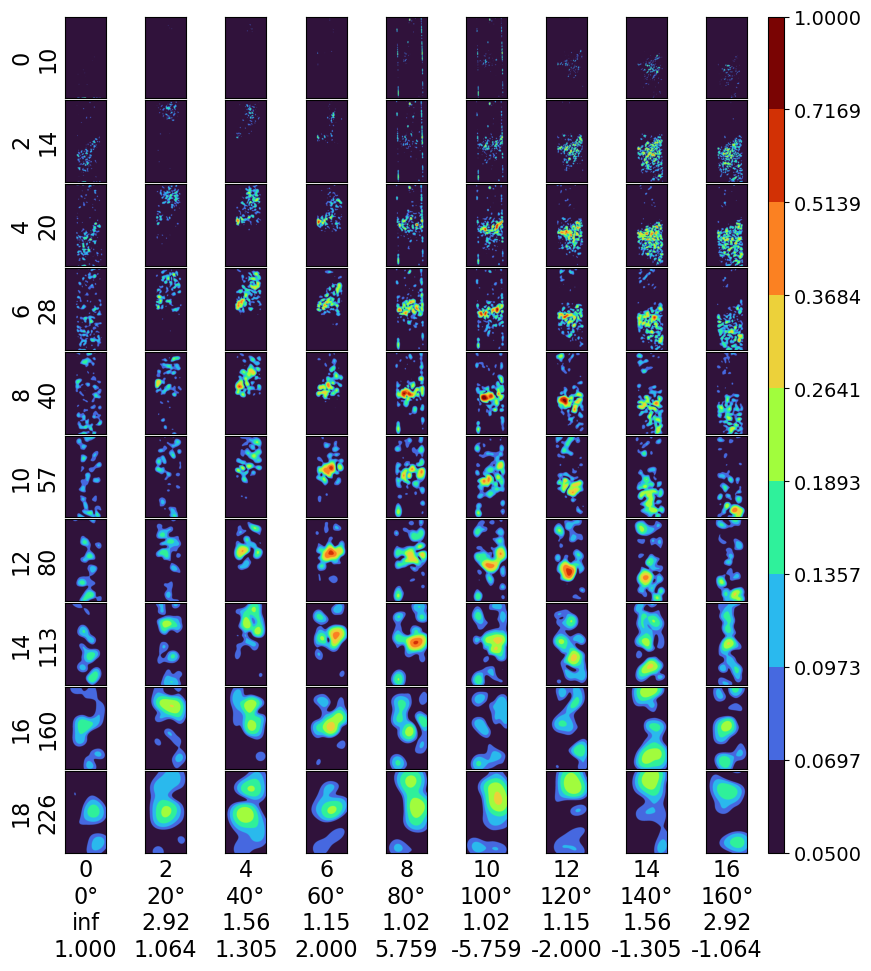

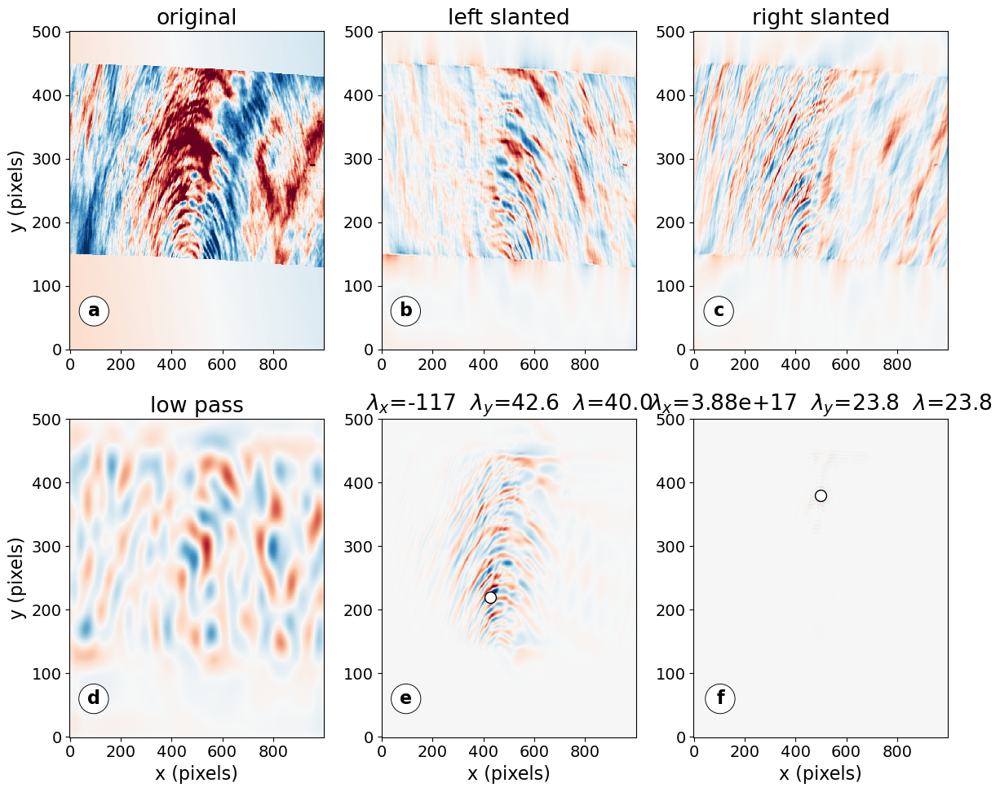

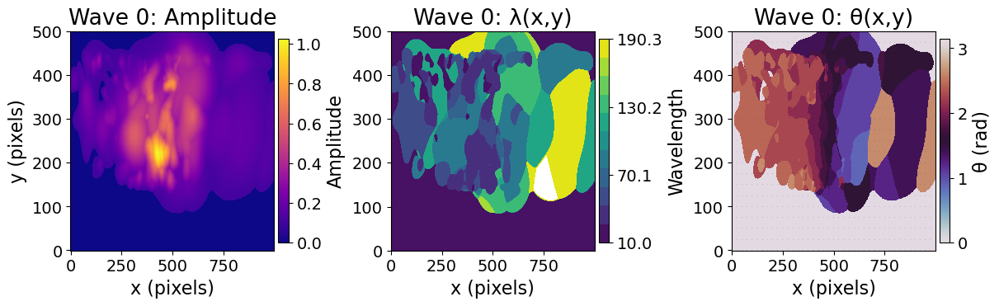

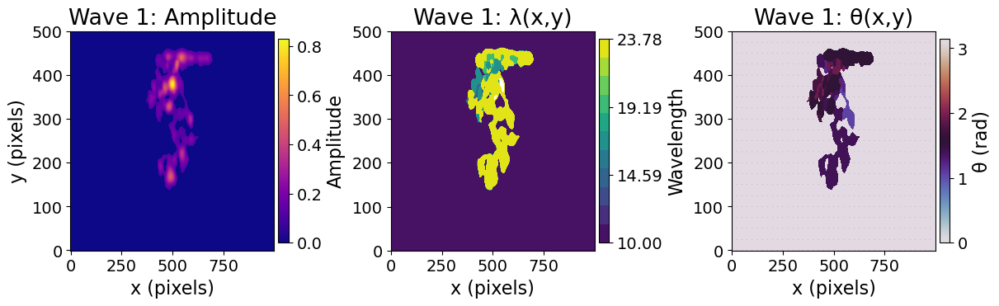

In [17]:
# example_decompose2d_from_nc_with_cluster_maps.py
# Load a radiance window from an AWE NetCDF file, run juwavelet 2D CWT,
# identify clusters, and also plot per-pixel amplitude, wavelength, and orientation
# for selected clusters. No files written.

from __future__ import annotations
import string
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from typing import Tuple
from netCDF4 import Dataset

from juwavelet import transform, utils

# --------------------------
# User params
# --------------------------
FILE_PATH = "awe_l3c_q20_2024074T0757_01756_v01.nc"  # same folder as notebook or script
FRAME_IDX = 0
# Use pixels for now. Adjust slices to taste.
X_SLICE = slice(3000, 4000)   # columns
Y_SLICE = slice(None, None)   # rows (all)

# Optional preprocessing
REMOVE_TREND = True      # subtract 2D plane before CWT
STANDARDIZE = True       # z-score to unit variance
GAUSS_BLUR_SIGMA = 0.0   # 0 disables, else pixels (e.g., 0.8)

# Wavelet params
S0 = 10
DJ = 0.25
JS = 20
JT = 18
ASPECT = 1

# Which cluster ids to make per-pixel maps for
WAVE_IDS_TO_MAP = [0, 1]

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 16,
    "font.size": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.figsize": [2 * 6.94, 2 * 4.29],
})

# --------------------------
# Helpers
# --------------------------
def load_radiance_window(
    path: str,
    frame_idx: int,
    xsl: slice,
    ysl: slice,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Returns (x_coords, y_coords, window) with window shape (ny, nx).
    x and y are pixel indices starting at 0.
    """
    with Dataset(path, "r") as nc:
        rad = nc.variables["Radiance"][:]  # shape (nframe, ny, nx)
    if rad.ndim != 3:
        raise ValueError(f"Radiance expected 3D (t,y,x). Got {rad.shape}")

    win = np.asarray(rad[frame_idx, ysl, xsl], dtype=float)
    ny, nx = win.shape

    # coords in pixel units
    x = np.arange(nx, dtype=float)
    y = np.arange(ny, dtype=float)

    # Clean NaNs and Infs
    med = float(np.nanmedian(win))
    win = np.nan_to_num(win, nan=med, posinf=med, neginf=med)

    return x, y, win

def detrend_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit and remove a 2D plane a x + b y + c from Z.
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return Z - plane

def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        return Z
    return gaussian_filter(Z, sigma=float(sigma))

def quicklook(x1d: np.ndarray, y1d: np.ndarray, Z: np.ndarray, title: str) -> None:
    fig, ax = plt.subplots()
    im = ax.pcolormesh(x1d, y1d, Z, shading="auto", cmap="gray")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label("Radiance (arb)")
    ax.set_xlabel("x (pixels)")
    ax.set_ylabel("y (pixels)")
    ax.set_title(title)
    plt.tight_layout()

def compute_cluster_maps(wave_id: int, cwt: dict, iwave: np.ndarray):
    """
    From an existing CWT and the identify_cluster2d labels (iwave),
    compute per-pixel amplitude, overall wavelength, and orientation
    for a selected cluster wave_id.

    Returns
    -------
    A : (ny, nx) amplitude map
    lam : (ny, nx) overall wavelength map
    theta_map : (ny, nx) orientation (radians, 0..pi from +x)
    """
    # CWT coeff dims are (js, jt, nx, ny)
    coeff = cwt["decomposition"]
    js, jt, nx, ny = coeff.shape

    power = np.abs(coeff) ** 2
    mask = (iwave == wave_id)

    # keep only bins of this wave
    power_sel = np.where(mask, power, 0.0)        # (js, jt, nx, ny)
    power_flat = power_sel.reshape(js * jt, nx, ny)

    # bin index of max power per pixel
    imax = np.argmax(power_flat, axis=0)          # (nx, ny)
    j_idx = (imax // jt)                          # scale index
    t_idx = (imax % jt)                           # angle index

    # amplitude map
    A = np.take_along_axis(power_flat, imax[np.newaxis, ...], axis=0).squeeze(0) ** 0.5  # (nx, ny)

    # component wavelengths at the picked bin
    lamx = cwt["wavelength_x"][j_idx, t_idx]      # (nx, ny)
    lamy = cwt["wavelength_y"][j_idx, t_idx]      # (nx, ny)

    # overall wavelength λ = 1 / sqrt(λx^{-2} + λy^{-2})
    inv2 = np.zeros_like(lamx, dtype=float)
    finite_x = np.isfinite(lamx) & (lamx != 0)
    finite_y = np.isfinite(lamy) & (lamy != 0)
    inv2 = np.where(finite_x, inv2 + (1.0 / lamx) ** 2, inv2)
    inv2 = np.where(finite_y, inv2 + (1.0 / lamy) ** 2, inv2)
    lam = np.where(inv2 == 0, np.inf, 1.0 / np.sqrt(inv2))

    # orientation from theta grid
    theta_vals = cwt["theta"]                     # (jt,)
    theta_map = theta_vals[t_idx]                 # (nx, ny)

    # return as (ny, nx) for plotting with x1d, y1d
    return A.T, lam.T, theta_map.T

# --------------------------
# Pipeline
# --------------------------
def run_pipeline():
    # Load a radiance window
    x1d, y1d, wave = load_radiance_window(FILE_PATH, FRAME_IDX, X_SLICE, Y_SLICE)

    # Show raw quicklook
    quicklook(x1d, y1d, wave, "Radiance (raw window)")

    # Preprocess
    proc = wave.copy()
    if REMOVE_TREND:
        proc = detrend_plane(proc)
    if STANDARDIZE:
        m = float(np.median(proc))
        s = float(np.std(proc))
        proc = (proc - m) / s if s > 0 else (proc - m)
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)
    quicklook(x1d, y1d, proc, "Radiance (preprocessed)")

    # Pixel spacing in km per pixel for labels only
    dx = 2.0
    dy = 2.0

    # juwavelet expects (nx, ny). Our arrays are (ny, nx) so transpose
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=dx, dy=dy, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # Identify clusters in (scale, angle, x, y)
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=0.25, thr=0.1)

    # Keep a copy of decomposition for masking panels
    decomposition = cwt["decomposition"]
    period = cwt["period"]
    theta = cwt["theta"]
    orig = decomposition.copy()

    # Overview CWT plot
    cmap = matplotlib.cm.turbo
    norm = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.05), np.log(1.0), 10)), cmap.N
    )
    fig1, _ = utils.plot_decomposition2d(cwt, redux_s=2, redux_t=2, cmap=cmap, norm=norm)

    # Component panels
    fig2, axs = plt.subplots(2, 3, figsize=(12, 10))
    axs = axs.T  # (3, 2)
    opts = {"cmap": "RdBu_r", "vmin": -2.5, "vmax": 2.5, "rasterized": True}

    # original
    axs[0, 0].set_title("original")
    axs[0, 0].pcolormesh(x1d, y1d, proc, **opts)

    # left slanted (theta > pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (np.pi / 2 < theta)] = 0
    rec = transform.reconstruct2d(cwt)  # (nx, ny)
    axs[1, 0].set_title("left slanted")
    axs[1, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # right slanted (theta <= pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (theta <= np.pi / 2)] = 0
    rec = transform.reconstruct2d(cwt)
    axs[2, 0].set_title("right slanted")
    axs[2, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # low pass (period >= 100 kept)
    decomposition[:] = orig
    decomposition[period < 100] = 0
    rec = transform.reconstruct2d(cwt)
    axs[0, 1].set_title("low pass")
    axs[0, 1].pcolormesh(x1d, y1d, rec.T, **opts)

    # highlight two identified waves if present
    demo_indices = [0, 1]
    targets = [(1, axs[1, 1]), (2, axs[2, 1])]

    def _fmt(v):
        if not np.isfinite(v):
            return "∞"
        v = float(v)
        if abs(v) >= 1000 or abs(v) < 0.1:
            return f"{v:.2e}"
        elif abs(v) >= 100:
            return f"{v:.0f}"
        else:
            return f"{v:.1f}"

    for (demo_idx, (rowi, ax)) in zip(demo_indices, targets):
        if isinstance(idxs, (list, tuple)) and demo_idx < len(idxs):
            decomposition[:] = orig
            decomposition[iwave != demo_idx] = 0
            udx = idxs[demo_idx]  # (scale_index, angle_index)
            rec = transform.reconstruct2d(cwt)
            lamx = cwt["wavelength_x"][udx[0], udx[1]]
            lamy = cwt["wavelength_y"][udx[0], udx[1]]
            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.set_title(
                rf"$\lambda_x$={_fmt(lamx)}  "
                rf"$\lambda_y$={_fmt(lamy)}  "
                rf"$\lambda$={_fmt(lam)}"
            )
            ax.pcolormesh(x1d, y1d, rec.T, **opts)

            # mark peak location
            decomposition[:] = np.abs(decomposition)
            max_idx = np.unravel_index(
                decomposition[udx[0], udx[1]].argmax(), decomposition[0, 0].shape
            )
            ax.plot(x1d[max_idx[0]], y1d[max_idx[1]], "o", color="w", mec="k", ms=10)
            # <-- add this restore so the next panel starts from the full CWT
            decomposition[:] = orig
        else:
            ax.set_title(f"wave {demo_idx} not found")
            ax.axis("off")

    # labels
    for ax in axs[:, 1]:
        ax.set_xlabel("x (pixels)")
    for ax in axs[0, :]:
        ax.set_ylabel("y (pixels)")

    # letter tags
    letterbox = {"boxstyle": "circle", "lw": 0.67, "facecolor": "white", "edgecolor": "black"}
    for ax, letter in zip(axs.T.reshape(-1), string.ascii_lowercase):
        ax.text(0.12, 0.15, letter, transform=ax.transAxes,
                bbox=letterbox, va="top", ha="right", weight="bold")

    fig2.tight_layout()
    plt.show(fig1)
    plt.show(fig2)

    # --------------------------
    # Per-pixel maps for selected clusters
    # --------------------------
    for k, wave_id in enumerate(WAVE_IDS_TO_MAP):
        if not (isinstance(idxs, (list, tuple)) and wave_id < len(idxs)):
            print(f"[info] wave {wave_id} not present. Skipping maps.")
            continue

        Amap, Lmap, Thmap = compute_cluster_maps(wave_id, cwt, iwave)

        # Mask very low amplitudes to clean the plots
        amp_thr = 0.00 * np.nanmax(Amap)
        Aplot = np.where(Amap >= amp_thr, Amap, np.nan)
        Lplot = np.where(Amap >= amp_thr, Lmap, np.nan)
        Thplot = np.where(Amap >= amp_thr, Thmap, np.nan)

        # Wavelength levels
        finite_L = Lplot[np.isfinite(Lplot)]
        if finite_L.size:
            lmin, lmax = np.nanpercentile(finite_L, [5, 95])
            if np.isfinite(lmin) and np.isfinite(lmax) and lmax > lmin:
                lam_levels = np.linspace(lmin, lmax, 12)
                lam_ticks = np.linspace(lmin, lmax, 4)
            else:
                lam_levels = None
                lam_ticks = None
        else:
            lam_levels = None
            lam_ticks = None

        # Make a compact 1 x 3 panel for this wave
        figk, axk = plt.subplots(1, 3, figsize=(12, 3.6), constrained_layout=True)

        im0 = axk[0].pcolormesh(x1d, y1d, Aplot, shading="auto", cmap="plasma")
        figk.colorbar(im0, ax=axk[0], fraction=0.05, pad=0.02, label="Amplitude")
        axk[0].set_title(f"Wave {wave_id}: Amplitude")
        axk[0].set_xlabel("x (pixels)"); axk[0].set_ylabel("y (pixels)")

        if lam_levels is not None:
            im1 = axk[1].contourf(x1d, y1d, Lplot, levels=lam_levels, cmap="viridis")
            c1 = figk.colorbar(im1, ax=axk[1], fraction=0.05, pad=0.02, label="Wavelength")
            c1.set_ticks(lam_ticks)
        else:
            im1 = axk[1].pcolormesh(x1d, y1d, Lplot, shading="auto", cmap="viridis")
            figk.colorbar(im1, ax=axk[1], fraction=0.05, pad=0.02, label="Wavelength")
        axk[1].set_title(f"Wave {wave_id}: λ(x,y)")
        axk[1].set_xlabel("x (pixels)")

        # Orientation map and arrows
        im2 = axk[2].pcolormesh(x1d, y1d, Thplot, shading="auto", cmap="twilight", vmin=0, vmax=np.pi)
        figk.colorbar(im2, ax=axk[2], fraction=0.05, pad=0.02, label="θ (rad)")
        step_y = max(1, len(y1d) // 20)
        step_x = max(1, len(x1d) // 40)
        Xg, Yg = np.meshgrid(x1d, y1d)
        U = np.cos(Thplot)
        V = np.sin(Thplot)
        axk[2].quiver(Xg[::step_y, ::step_x], Yg[::step_y, ::step_x],
                      U[::step_y, ::step_x], V[::step_y, ::step_x],
                      angles="xy", scale_units="xy", scale=0.8, width=0.002)
        axk[2].set_title(f"Wave {wave_id}: θ(x,y)")
        axk[2].set_xlabel("x (pixels)")

        plt.show(figk)

# --------------------------
# Run
# --------------------------
if __name__ == "__main__":
    run_pipeline()


------------
cluster= 0
amplitude= 1.0244810488430511 idx= (np.int64(8), np.int64(7), np.int64(435), np.int64(219))
selected elements: 621777
------------
cluster= 1
amplitude= 0.8286693982246465 idx= (np.int64(5), np.int64(6), np.int64(500), np.int64(380))
selected elements: 41546
------------
cluster= 2
amplitude= 0.7271726758004743 idx= (np.int64(5), np.int64(3), np.int64(547), np.int64(158))
selected elements: 195915
------------
cluster= 3
amplitude= 0.701535048364669 idx= (np.int64(8), np.int64(5), np.int64(500), np.int64(219))
selected elements: 142681
------------
cluster= 4
amplitude= 0.6645087188743487 idx= (np.int64(6), np.int64(9), np.int64(395), np.int64(350))
selected elements: 220750
------------
cluster= 5
amplitude= 0.6052929012738978 idx= (np.int64(5), np.int64(6), np.int64(451), np.int64(238))
selected elements: 13180
------------
cluster= 6
amplitude= 0.6017819283478256 idx= (np.int64(11), np.int64(4), np.int64(602), np.int64(317))
selected elements: 291572


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 32.06it/s]


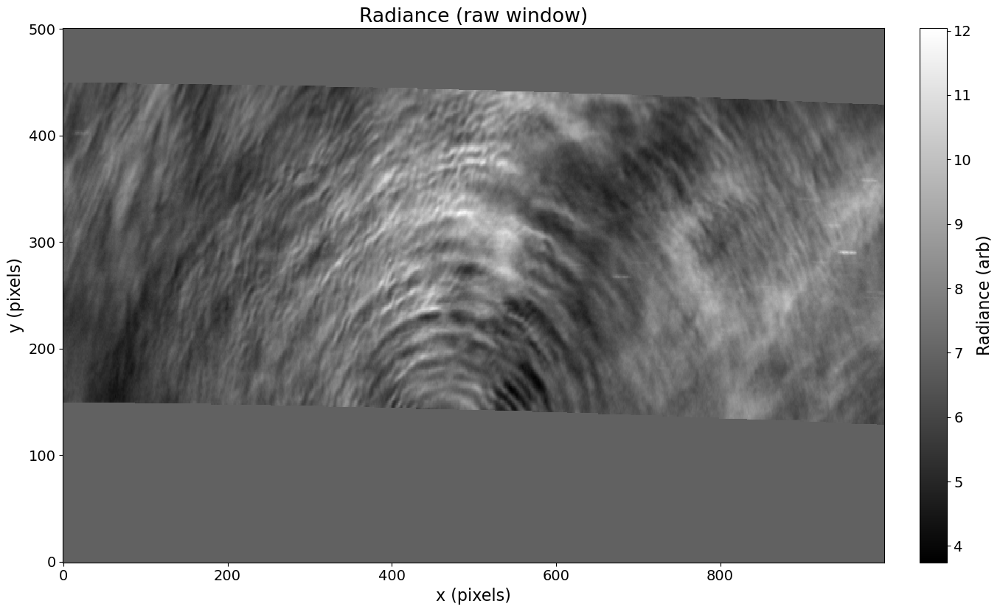

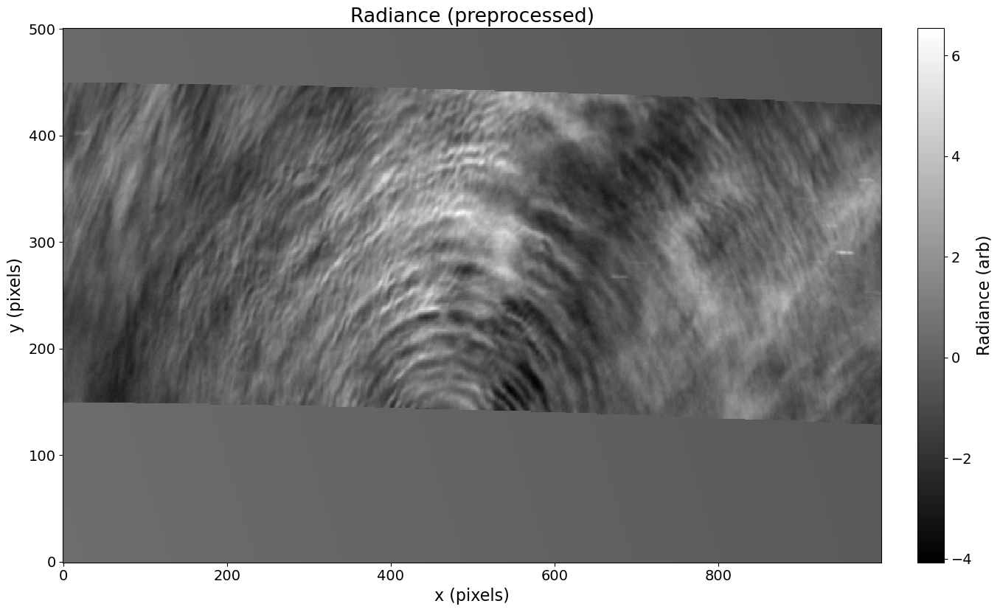

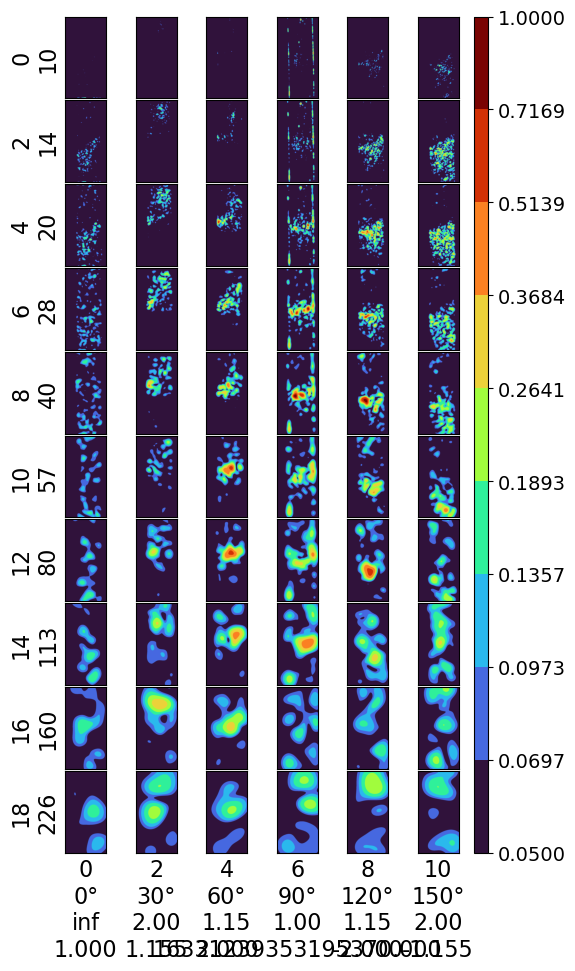

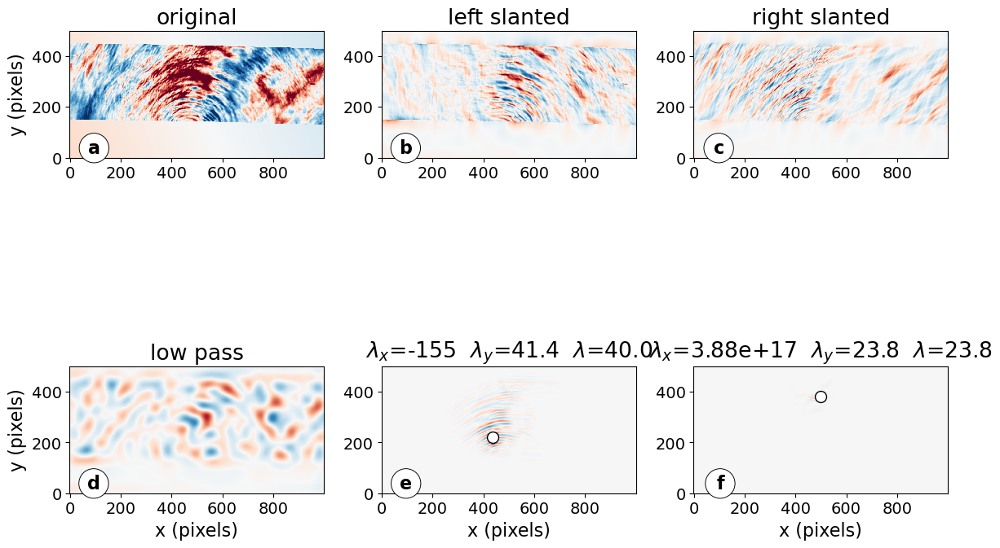

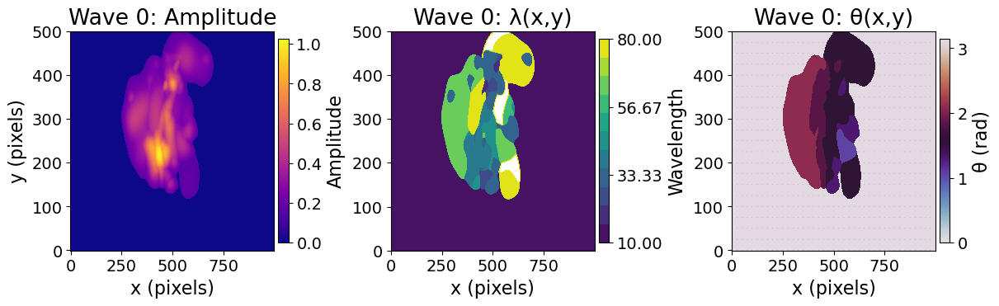

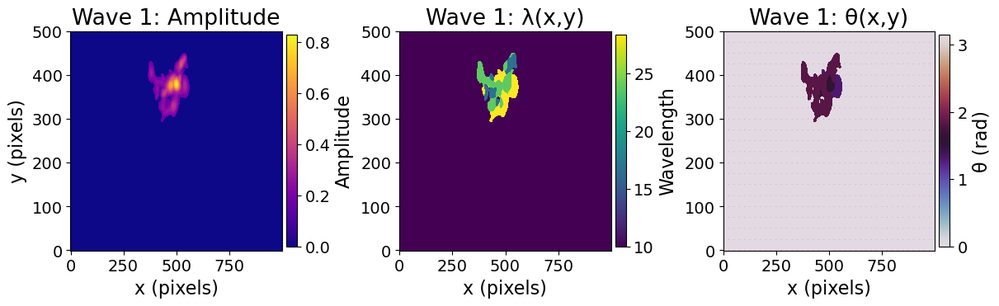

In [214]:
# example_decompose2d_from_nc_with_cluster_maps.py
# Load a radiance window from an AWE NetCDF file, run juwavelet 2D CWT,
# identify clusters, and also plot per-pixel amplitude, wavelength, and orientation
# for selected clusters. No files written.

from __future__ import annotations
import string
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from typing import Tuple
from netCDF4 import Dataset

from juwavelet import transform, utils

# --------------------------
# User params
# --------------------------
FILE_PATH = "awe_l3c_q20_2024074T0757_01756_v01.nc"  # same folder as notebook or script
FRAME_IDX = 0
# Use pixels for now. Adjust slices to taste.
X_SLICE = slice(3000, 4000)   # columns
Y_SLICE = slice(None, None)   # rows (all)

# Optional preprocessing
REMOVE_TREND = True      # subtract 2D plane before CWT
STANDARDIZE = True       # z-score to unit variance
GAUSS_BLUR_SIGMA = 0.0   # 0 disables, else pixels (e.g., 0.8)

# Wavelet params
S0 = 10
DJ = 0.25
JS = 20
JT = 12
ASPECT = 1

# Which cluster ids to make per-pixel maps for
WAVE_IDS_TO_MAP = [0, 1]

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 16,
    "font.size": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.figsize": [2 * 6.94, 2 * 4.29],
})

# --------------------------
# Helpers
# --------------------------
def load_radiance_window(
    path: str,
    frame_idx: int,
    xsl: slice,
    ysl: slice,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Returns (x_coords, y_coords, window) with window shape (ny, nx).
    x and y are pixel indices starting at 0.
    """
    with Dataset(path, "r") as nc:
        rad = nc.variables["Radiance"][:]  # shape (nframe, ny, nx)
    if rad.ndim != 3:
        raise ValueError(f"Radiance expected 3D (t,y,x). Got {rad.shape}")

    win = np.asarray(rad[frame_idx, ysl, xsl], dtype=float)
    ny, nx = win.shape

    # coords in pixel units
    x = np.arange(nx, dtype=float)
    y = np.arange(ny, dtype=float)

    # Clean NaNs and Infs
    med = float(np.nanmedian(win))
    win = np.nan_to_num(win, nan=med, posinf=med, neginf=med)

    return x, y, win

def detrend_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit and remove a 2D plane a x + b y + c from Z.
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return Z - plane

def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        return Z
    return gaussian_filter(Z, sigma=float(sigma))

def quicklook(x1d: np.ndarray, y1d: np.ndarray, Z: np.ndarray, title: str) -> None:
    fig, ax = plt.subplots()
    im = ax.pcolormesh(x1d, y1d, Z, shading="auto", cmap="gray")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label("Radiance (arb)")
    ax.set_xlabel("x (pixels)")
    ax.set_ylabel("y (pixels)")
    ax.set_title(title)
    plt.tight_layout()

def compute_cluster_maps(wave_id: int, cwt: dict, iwave: np.ndarray):
    """
    From an existing CWT and the identify_cluster2d labels (iwave),
    compute per-pixel amplitude, overall wavelength, and orientation
    for a selected cluster wave_id.

    Returns
    -------
    A : (ny, nx) amplitude map
    lam : (ny, nx) overall wavelength map
    theta_map : (ny, nx) orientation (radians, 0..pi from +x)
    """
    # CWT coeff dims are (js, jt, nx, ny)
    coeff = cwt["decomposition"]
    js, jt, nx, ny = coeff.shape

    power = np.abs(coeff) ** 2
    mask = (iwave == wave_id)

    # keep only bins of this wave
    power_sel = np.where(mask, power, 0.0)        # (js, jt, nx, ny)
    power_flat = power_sel.reshape(js * jt, nx, ny)

    # bin index of max power per pixel
    imax = np.argmax(power_flat, axis=0)          # (nx, ny)
    j_idx = (imax // jt)                          # scale index
    t_idx = (imax % jt)                           # angle index

    # amplitude map
    A = np.take_along_axis(power_flat, imax[np.newaxis, ...], axis=0).squeeze(0) ** 0.5  # (nx, ny)

    # component wavelengths at the picked bin
    lamx = cwt["wavelength_x"][j_idx, t_idx]      # (nx, ny)
    lamy = cwt["wavelength_y"][j_idx, t_idx]      # (nx, ny)

    # overall wavelength λ = 1 / sqrt(λx^{-2} + λy^{-2})
    inv2 = np.zeros_like(lamx, dtype=float)
    finite_x = np.isfinite(lamx) & (lamx != 0)
    finite_y = np.isfinite(lamy) & (lamy != 0)
    inv2 = np.where(finite_x, inv2 + (1.0 / lamx) ** 2, inv2)
    inv2 = np.where(finite_y, inv2 + (1.0 / lamy) ** 2, inv2)
    lam = np.where(inv2 == 0, np.inf, 1.0 / np.sqrt(inv2))

    # orientation from theta grid
    theta_vals = cwt["theta"]                     # (jt,)
    theta_map = theta_vals[t_idx]                 # (nx, ny)

    # return as (ny, nx) for plotting with x1d, y1d
    return A.T, lam.T, theta_map.T

# --------------------------
# Pipeline
# --------------------------
def run_pipeline():
    # Load a radiance window
    x1d, y1d, wave = load_radiance_window(FILE_PATH, FRAME_IDX, X_SLICE, Y_SLICE)

    # Show raw quicklook
    quicklook(x1d, y1d, wave, "Radiance (raw window)")

    # Preprocess
    proc = wave.copy()
    if REMOVE_TREND:
        proc = detrend_plane(proc)
    if STANDARDIZE:
        m = float(np.median(proc))
        s = float(np.std(proc))
        proc = (proc - m) / s if s > 0 else (proc - m)
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)
    quicklook(x1d, y1d, proc, "Radiance (preprocessed)")

    # Pixel spacing in km per pixel for labels only
    dx = 2.0
    dy = 2.0

    # juwavelet expects (nx, ny). Our arrays are (ny, nx) so transpose
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=dx, dy=dy, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # Identify clusters in (scale, angle, x, y)
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=0.6, thr=0.15)

    # Keep a copy of decomposition for masking panels
    decomposition = cwt["decomposition"]
    period = cwt["period"]
    theta = cwt["theta"]
    orig = decomposition.copy()

    # Overview CWT plot
    cmap = matplotlib.cm.turbo
    norm = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.05), np.log(1.0), 10)), cmap.N
    )
    fig1, _ = utils.plot_decomposition2d(cwt, redux_s=2, redux_t=2, cmap=cmap, norm=norm)

    # Component panels
    fig2, axs = plt.subplots(2, 3, figsize=(12, 10))
    axs = axs.T  # (3, 2)
    opts = {"cmap": "RdBu_r", "vmin": -2.5, "vmax": 2.5, "rasterized": True}

    for ax in fig2.axes:
        ax.set_aspect("equal", adjustable="box")

    # original
    axs[0, 0].set_title("original")
    axs[0, 0].pcolormesh(x1d, y1d, proc, **opts)

    # left slanted (theta > pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (np.pi / 2 < theta)] = 0
    rec = transform.reconstruct2d(cwt)  # (nx, ny)
    axs[1, 0].set_title("left slanted")
    axs[1, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # right slanted (theta <= pi/2 masked out)
    decomposition[:] = orig
    decomposition[:, (theta <= np.pi / 2)] = 0
    rec = transform.reconstruct2d(cwt)
    axs[2, 0].set_title("right slanted")
    axs[2, 0].pcolormesh(x1d, y1d, rec.T, **opts)

    # low pass (period >= 100 kept)
    decomposition[:] = orig
    decomposition[period < 100] = 0
    rec = transform.reconstruct2d(cwt)
    axs[0, 1].set_title("low pass")
    axs[0, 1].pcolormesh(x1d, y1d, rec.T, **opts)

    # highlight two identified waves if present
    demo_indices = [0, 1]
    targets = [(1, axs[1, 1]), (2, axs[2, 1])]

    def _fmt(v):
        if not np.isfinite(v):
            return "∞"
        v = float(v)
        if abs(v) >= 1000 or abs(v) < 0.1:
            return f"{v:.2e}"
        elif abs(v) >= 100:
            return f"{v:.0f}"
        else:
            return f"{v:.1f}"

    for (demo_idx, (rowi, ax)) in zip(demo_indices, targets):
        if isinstance(idxs, (list, tuple)) and demo_idx < len(idxs):
            decomposition[:] = orig
            decomposition[iwave != demo_idx] = 0
            udx = idxs[demo_idx]  # (scale_index, angle_index)
            rec = transform.reconstruct2d(cwt)
            lamx = cwt["wavelength_x"][udx[0], udx[1]]
            lamy = cwt["wavelength_y"][udx[0], udx[1]]
            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.set_title(
                rf"$\lambda_x$={_fmt(lamx)}  "
                rf"$\lambda_y$={_fmt(lamy)}  "
                rf"$\lambda$={_fmt(lam)}"
            )
            ax.pcolormesh(x1d, y1d, rec.T, **opts)

            # mark peak location
            decomposition[:] = np.abs(decomposition)
            max_idx = np.unravel_index(
                decomposition[udx[0], udx[1]].argmax(), decomposition[0, 0].shape
            )
            ax.plot(x1d[max_idx[0]], y1d[max_idx[1]], "o", color="w", mec="k", ms=10)
            # <-- add this restore so the next panel starts from the full CWT
            decomposition[:] = orig
        else:
            ax.set_title(f"wave {demo_idx} not found")
            ax.axis("off")

    # labels
    for ax in axs[:, 1]:
        ax.set_xlabel("x (pixels)")
    for ax in axs[0, :]:
        ax.set_ylabel("y (pixels)")

    # letter tags
    letterbox = {"boxstyle": "circle", "lw": 0.67, "facecolor": "white", "edgecolor": "black"}
    for ax, letter in zip(axs.T.reshape(-1), string.ascii_lowercase):
        ax.text(0.12, 0.15, letter, transform=ax.transAxes,
                bbox=letterbox, va="top", ha="right", weight="bold")

    fig2.tight_layout()
    plt.show(fig1)
    plt.show(fig2)

    # --------------------------
    # Per-pixel maps for selected clusters
    # --------------------------
    for k, wave_id in enumerate(WAVE_IDS_TO_MAP):
        if not (isinstance(idxs, (list, tuple)) and wave_id < len(idxs)):
            print(f"[info] wave {wave_id} not present. Skipping maps.")
            continue

        Amap, Lmap, Thmap = compute_cluster_maps(wave_id, cwt, iwave)

        # Mask very low amplitudes to clean the plots
        amp_thr = 0.00 * np.nanmax(Amap)
        Aplot = np.where(Amap >= amp_thr, Amap, np.nan)
        Lplot = np.where(Amap >= amp_thr, Lmap, np.nan)
        Thplot = np.where(Amap >= amp_thr, Thmap, np.nan)

        # Wavelength levels
        finite_L = Lplot[np.isfinite(Lplot)]
        if finite_L.size:
            lmin, lmax = np.nanpercentile(finite_L, [5, 95])
            if np.isfinite(lmin) and np.isfinite(lmax) and lmax > lmin:
                lam_levels = np.linspace(lmin, lmax, 12)
                lam_ticks = np.linspace(lmin, lmax, 4)
            else:
                lam_levels = None
                lam_ticks = None
        else:
            lam_levels = None
            lam_ticks = None

        # Make a compact 1 x 3 panel for this wave
        figk, axk = plt.subplots(1, 3, figsize=(12, 3.6), constrained_layout=True)

        im0 = axk[0].pcolormesh(x1d, y1d, Aplot, shading="auto", cmap="plasma")
        figk.colorbar(im0, ax=axk[0], fraction=0.05, pad=0.02, label="Amplitude")
        axk[0].set_title(f"Wave {wave_id}: Amplitude")
        axk[0].set_xlabel("x (pixels)"); axk[0].set_ylabel("y (pixels)")

        if lam_levels is not None:
            im1 = axk[1].contourf(x1d, y1d, Lplot, levels=lam_levels, cmap="viridis")
            c1 = figk.colorbar(im1, ax=axk[1], fraction=0.05, pad=0.02, label="Wavelength")
            c1.set_ticks(lam_ticks)
        else:
            im1 = axk[1].pcolormesh(x1d, y1d, Lplot, shading="auto", cmap="viridis")
            figk.colorbar(im1, ax=axk[1], fraction=0.05, pad=0.02, label="Wavelength")
        axk[1].set_title(f"Wave {wave_id}: λ(x,y)")
        axk[1].set_xlabel("x (pixels)")

        # Orientation map and arrows
        im2 = axk[2].pcolormesh(x1d, y1d, Thplot, shading="auto", cmap="twilight", vmin=0, vmax=np.pi)
        figk.colorbar(im2, ax=axk[2], fraction=0.05, pad=0.02, label="θ (rad)")
        step_y = max(1, len(y1d) // 20)
        step_x = max(1, len(x1d) // 40)
        Xg, Yg = np.meshgrid(x1d, y1d)
        U = np.cos(Thplot)
        V = np.sin(Thplot)
        axk[2].quiver(Xg[::step_y, ::step_x], Yg[::step_y, ::step_x],
                      U[::step_y, ::step_x], V[::step_y, ::step_x],
                      angles="xy", scale_units="xy", scale=0.8, width=0.002)
        axk[2].set_title(f"Wave {wave_id}: θ(x,y)")
        axk[2].set_xlabel("x (pixels)")

        plt.show(figk)

# --------------------------
# Run
# --------------------------
if __name__ == "__main__":
    run_pipeline()
